## Introduction
### Motivation
Our primary motivation is to explore how extremely small datasets impact model training and performance. Specifically, we aim to understand the challenges and limitations posed by datasets with minimal samples per class, such as EMDS-6. By investigating these effects, we hope to identify viable strategies and methods to achieve better results, even when working with such constrained data availability. This exploration is crucial for advancing our ability to train robust models in scenarios where data collection is costly or limited.

### Problem Statement
Environmental microorganisms (EMs) are ubiquitous and significantly impact humansurvivaland development. The detection and identification of these microorganisms are crucial for various applications,including environmental monitoring, disease prevention, and industrial processes. Traditional methods of identifying EMs involve manual microscopic analysis, which is labor-intensive, time-consuming, and prone to human error. 

This project aims to develop an automated system for analyzing EM images using deep learning techniques. The goal is to enhance the accuracy and efficiency of tasks such as image denoising, feature extraction, image classification, and image segmentation.



## Data Sources

**Data Sources**:
- **Dataset Name**: EMDS-6
- **Contributing Team**: Peng Zhao, Chen Li*, Md Mamunur Rahaman, Hao Xu, Pingli Ma, Hechen Yang, Hongzan Sun, Tao Jiang*, Ning Xu and Marcin Grzegorzek

**Releated Paper**: 
- **Title**: EMDS-6: Environmental Microorganism Image Dataset Sixth Version for Image Denoising, Segmentation, Feature Extraction, Classification, and Detection Method Evaluation 
- **Link to Paper**: [Click here to view the paper](https://www.frontiersin.org/journals/microbiology/articles/10.3389/fmicb.2022.829027/full)

**Dataset Description:** 
- **Content**: EMDS-6 dataset provided a diverse range of microorganisms across 21 different class, and for each images, EMDS-6 includes a corresponding ground truth (GT) image which serve as valuable benchmarks for evaluating the performance of tasks like image segmentation and target detection, enhancing its utility in various applications such as denoising, image segmentation, feature extraction, image classification
- **Data Type**: PNG Images
- **Dataset Scale**: 
    - **Total Number of Images**: The EMDS-6 dataset comprises 1680 environmental microorganism images
    - **Total Number of Classes** featuring 21 distinct classes of original EM images
    - **Number and Scale of Subsets**: each class containing 40 images. This totals 840 original images, with each accompanied by a corresponding GT image, also totaling 840.
- **Data Structure**: Under the EMDS-6 folders we have two subfolder. EMDS5-Orginal folder contains all the images for 21 different classes divided into 21 files, and their corresponding Ground Truth images could be found at Equivalent EMDS5-Ground Truth folder.

**Access**:
- **Access Permission**: available for direct download via the link provided in the paper.
- **Download Link**: [https://figshare.com/articles/dataset/EMDS6/17125025/1](https://figshare.com/articles/dataset/EMDS6/17125025/1)











## Exploratory Analysis of Data

EMDS-6 is a **balanced** dataset that has 840 images, 21 annotation class.

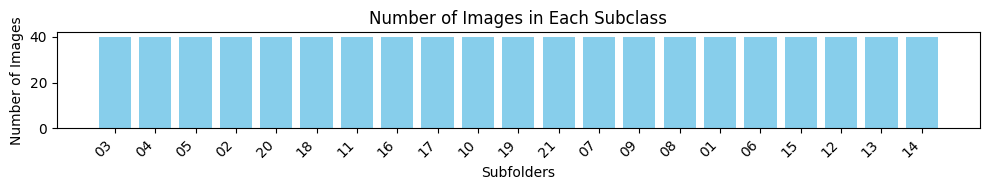

In [ ]:
import os
import matplotlib.pyplot as plt

def count_images_in_class(directory):
    image_extensions = {'.png' }
    folder_image_count = {}
    
    for root, dirs, files in os.walk(directory):
        for subfolder in dirs:
            subfolder_path = os.path.join(root, subfolder)
            image_count = 0
            for file in os.listdir(subfolder_path):
                if os.path.splitext(file)[1].lower() in image_extensions:
                    image_count += 1
            folder_image_count[subfolder] = image_count
    
    return folder_image_count

def visualize_image_counts(image_counts):
    folders = list(image_counts.keys())
    counts = list(image_counts.values())
    
    plt.figure(figsize=(10, 2))
    plt.bar(folders, counts, color='skyblue')
    plt.xlabel('Subfolders')
    plt.ylabel('Number of Images')
    plt.title('Number of Images in Each Subclass')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

directory_path = 'EMDS-6/EMDS5-Original'
result = count_images_in_class(directory_path)
visualize_image_counts(result)


The balanced dataset provided several advantage in classification tasks.
- **Prevent misclassification**: If there are far more examples of one class in the dataset than other classes, the model may favor the more frequent class and ignore or misclassify the less frequent class.
- **Increase model performance**: Balanced dataset could help model improve the ability to learn the difference between classes.
- **Reliable performance evaluation**: Balanced dataset can ensure performance indexes, such as accuracy, recall, F1 score, to be more reliable. In our classification task section, we will provide performance matrix to illustrate how different models perform variably across different classes.

But on the other hand, as shown in the bar chart, EMDS-6 is an extremly small dataset which only have 40 images per class. Furthermore, according to 'EMDS-6: Environmental Microorganism Image Dataset Sixth Version for Image Denoising, Segmentation, Feature Extraction, Classification, and Detection Method Evaluation', in order to avoid the experimental results being quite contingent, 37.5% of the data is used to test the performance of the model to increase the reliablity of the experiment, which presents us with a greater challenge.

The following bar chart illustrate the variance in width and height for different classes.

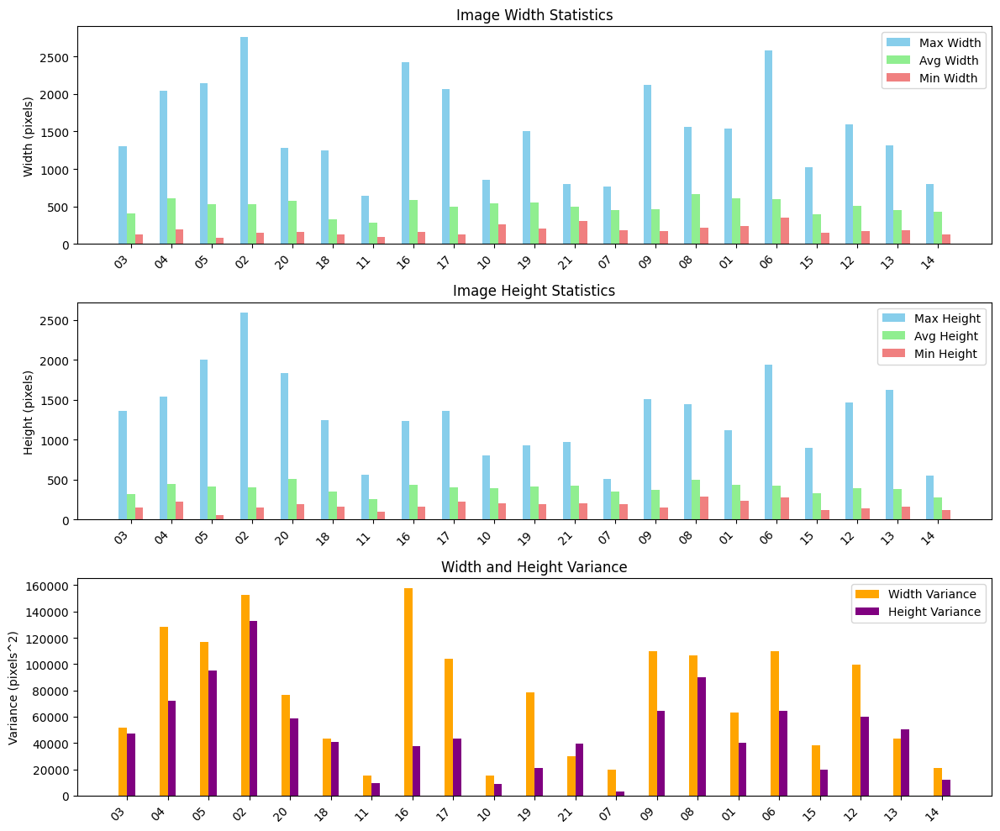

In [ ]:
import os
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

def get_image_statistics(directory):
    image_extensions = {'.png', '.jpg', '.jpeg', '.gif', '.bmp', '.tiff'}
    folder_stats = {}

    for root, dirs, files in os.walk(directory):
        for subfolder in dirs:
            subfolder_path = os.path.join(root, subfolder)
            widths = []
            heights = []

            for file in os.listdir(subfolder_path):
                if os.path.splitext(file)[1].lower() in image_extensions:
                    image_path = os.path.join(subfolder_path, file)
                    with Image.open(image_path) as img:
                        width, height = img.size
                        widths.append(width)
                        heights.append(height)

            if widths and heights:
                max_width = int(np.max(widths))
                min_width = int(np.min(widths))
                avg_width = int(np.mean(widths))
                var_width = int(np.var(widths))
                max_height = int(np.max(heights))
                min_height = int(np.min(heights))
                avg_height = int(np.mean(heights))
                var_height = int(np.var(heights))

                folder_stats[subfolder] = {
                    'max_width': max_width,
                    'min_width': min_width,
                    'avg_width': avg_width,
                    'var_width': var_width,
                    'max_height': max_height,
                    'min_height': min_height,
                    'avg_height': avg_height,
                    'var_height': var_height
                }

    return folder_stats

def visualize_image_statistics(stats):
    subfolders = list(stats.keys())
    
    max_widths = [stats[sub]['max_width'] for sub in subfolders]
    min_widths = [stats[sub]['min_width'] for sub in subfolders]
    avg_widths = [stats[sub]['avg_width'] for sub in subfolders]
    var_widths = [stats[sub]['var_width'] for sub in subfolders]
    max_heights = [stats[sub]['max_height'] for sub in subfolders]
    min_heights = [stats[sub]['min_height'] for sub in subfolders]
    avg_heights = [stats[sub]['avg_height'] for sub in subfolders]
    var_heights = [stats[sub]['var_height'] for sub in subfolders]

    x = np.arange(len(subfolders))

    plt.figure(figsize=(12, 10))

    plt.subplot(3, 1, 1)
    plt.bar(x - 0.2, max_widths, width=0.2, label='Max Width', color='skyblue')
    plt.bar(x, avg_widths, width=0.2, label='Avg Width', color='lightgreen')
    plt.bar(x + 0.2, min_widths, width=0.2, label='Min Width', color='lightcoral')
    plt.ylabel('Width (pixels)')
    plt.title('Image Width Statistics')
    plt.xticks(x, subfolders, rotation=45, ha='right')
    plt.legend()

    plt.subplot(3, 1, 2)
    plt.bar(x - 0.2, max_heights, width=0.2, label='Max Height', color='skyblue')
    plt.bar(x, avg_heights, width=0.2, label='Avg Height', color='lightgreen')
    plt.bar(x + 0.2, min_heights, width=0.2, label='Min Height', color='lightcoral')
    plt.ylabel('Height (pixels)')
    plt.title('Image Height Statistics')
    plt.xticks(x, subfolders, rotation=45, ha='right')
    plt.legend()

    plt.subplot(3, 1, 3)
    plt.bar(x - 0.1, var_widths, width=0.2, label='Width Variance', color='orange')
    plt.bar(x + 0.1, var_heights, width=0.2, label='Height Variance', color='purple')
    plt.ylabel('Variance (pixels^2)')
    plt.title('Width and Height Variance')
    plt.xticks(x, subfolders, rotation=45, ha='right')
    plt.legend()

    plt.tight_layout()
    plt.show()

directory_path = 'EMDS-6/EMDS5-Original'
result = get_image_statistics(directory_path)
visualize_image_statistics(result)


As depicted, the variance in width and height for each category indicates that most categories of images don't have good consistency in image dimensions, which raised a big concern in data argumentation about what kind of methods do we need to perform, since lots of ML framework require all images in a batch to have same height and width, to get better performance. This topic will be discussed further in the image segmentation section.

In [ ]:
import os
from PIL import Image
import numpy as np
import pandas as pd

def get_image_statistics(directory):
    image_extensions = {'.png', '.jpg', '.jpeg', '.gif', '.bmp', '.tiff'}
    folder_stats = {}

    for root, dirs, files in os.walk(directory):
        for subfolder in dirs:
            subfolder_path = os.path.join(root, subfolder)
            widths = []
            heights = []
            channels = []
            filecount = 0

            for file in os.listdir(subfolder_path):
                if os.path.splitext(file)[1].lower() in image_extensions:
                    filecount += 1
                    image_path = os.path.join(subfolder_path, file)
                    with Image.open(image_path) as img:
                        width, height = img.size
                        mode = img.mode
                        widths.append(width)
                        heights.append(height)
                        if mode == 'L':
                            channels.append(1)
                        elif mode == 'RGB':
                            channels.append(3)
                        elif mode == 'RGBA':
                            channels.append(4)
                        else:
                            channels.append(0)

            if widths and heights and channels:
                max_width = int(np.max(widths))
                min_width = int(np.min(widths))
                avg_width = int(np.mean(widths))
                max_height = int(np.max(heights))
                min_height = int(np.min(heights))
                avg_height = int(np.mean(heights))
                unique_channels = np.unique(channels)

                folder_stats[subfolder] = {
                    'Object count': filecount,
                    'Max Width (px)': max_width,
                    'Min Width (px)': min_width,
                    'Avg Width (px)': avg_width,
                    'Max Height (px)': max_height,
                    'Min Height (px)': min_height,
                    'Avg Height (px)': avg_height,
                    'Image Channels': ', '.join(map(str, unique_channels))
                }

    return folder_stats

def display_statistics_table(stats):
    df = pd.DataFrame(stats).T
    pd.set_option('display.max_columns', None)
    pd.set_option('display.width', 1000)
    pd.set_option('display.max_colwidth', None)
    print(df)
    return df

directory_path = 'EMDS-6/EMDS5-Original'
result = get_image_statistics(directory_path)
df = display_statistics_table(result)


   Object count Max Width (px) Min Width (px) Avg Width (px) Max Height (px) Min Height (px) Avg Height (px) Image Channels
03           40           1301            128            409            1358             150             323              3
04           40           2048            187            605            1536             223             449              3
05           40           2148             76            527            1998              61             417              3
02           40           2766            145            527            2592             150             402              3
20           40           1280            160            575            1830             198             507              3
18           40           1250            122            322            1250             165             351              3
11           40            640             95            286             558             100             256              3
16      

This table gives various size properties of objects for every class in Orginial dataset. These data will be a good reference for data enhancement and image preprocessing.

In [ ]:
directory_path = 'EMDS-6/EMDS5-Ground Truth'
result = get_image_statistics(directory_path)
df = display_statistics_table(result)

   Object count Max Width (px) Min Width (px) Avg Width (px) Max Height (px) Min Height (px) Avg Height (px) Image Channels
03           40           1301            128            409            1358             150             323           1, 3
04           40           2048            187            605            1536             223             449           1, 3
05           40           2148             76            527            1998              61             417           1, 3
02           40           2766            145            527            2592             150             402           1, 3
20           40           1280            160            575            1830             198             507           1, 3
18           40           1250            122            322            1250             165             351           1, 3
11           40            640             95            286             558             100             256           1, 3
16      

For those Ground Truth images, a potential challenge is the presence of multiple color channels across different categories of Ground Truth images. ⁤The presence of multiple color channels across different categories of Ground Truth images introduces several issues.
- images with varying channels need to be transformed in image pre-processing
- some performance analysis method such as Jaccard and Dice will be miscalculated which lead resulted in erroneous performance metrics being presented in our PPT. This issue has now been fixed.

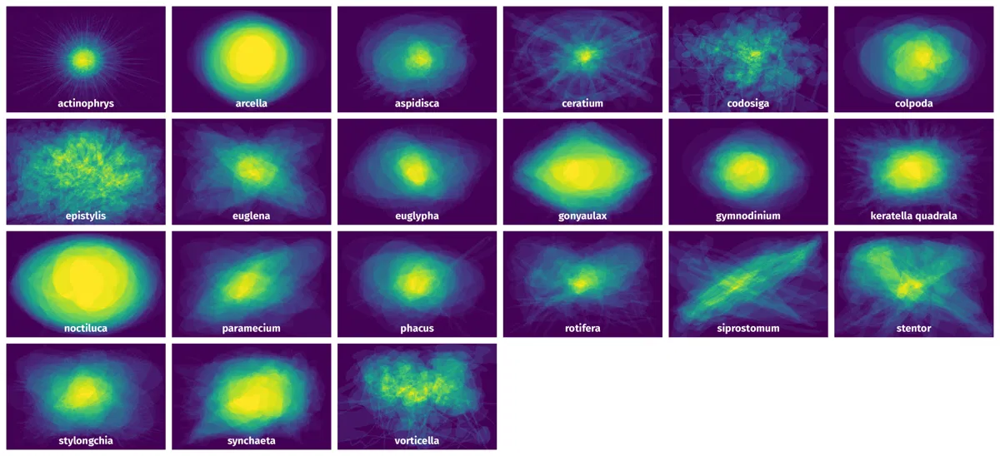

The Spatial Heatmap provided a reference for data argumention methods hyper-perermater setting. Most of the organisms are centred and for some special classes such as noctiluca, aggressive transfrom or image crop strategy would lead to incorrect image segmentation.

## Models and Methods 

### Denosing model - autoencoder
#### Methods
we aim to develop an autoencoder-based denoising model to restore images affected by various types of noise, including Salt-and-Pepper Noise (SPN), Poisson-Gaussian Noise (PGN), and Gaussian Noise (GN). Denoising is a crucial step in image processing as it enhances the quality and usability of images for further analysis. The primary objective is to evaluate the performance of the autoencoder in reducing noise and improving the visual quality of the images.

#### Noise Generation Methods
- **Salt-and-Pepper Noise (SPN)**:
SPN is characterized by random occurrences of black and white pixels, which we simulate by randomly setting pixel values to [1, 1, 1] (white) or [0, 0, 0] (black) with a specified density. This simulates the effect of binary noise in digital images.

- **Poisson-Gaussian Noise (PGN)**:
PGN combines Poisson and Gaussian distributions, simulating realistic noise often observed in low-light imaging. We generate PGN by applying Gaussian noise with a specified mean and variance to the image and then adjusting pixel values accordingly.

- **Gaussian Noise (GN)**:
GN is added by applying a normal distribution with a specified mean and standard deviation to each pixel, which models the effect of thermal noise in digital sensors.

#### Autoencoder Architecture
We employ a simple convolutional autoencoder consisting of an encoder and a decoder:
- **Encoder**: Two convolutional layers with ReLU activation, followed by max pooling for downsampling.
- **Decoder**: Two transpose convolutional layers with ReLU activation, followed by a final convolutional layer to reconstruct the image.
The autoencoder aims to learn a compressed representation of the image that preserves essential features while removing noise.

#### Implement

##### Setup and Imports
This section imports the necessary libraries and checks if a GPU is available for training. The GPU, if available, can significantly speed up the training process.

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import pandas as pd
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
import random

# Check if GPU is available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

Using device: cuda


##### Loading the Original Dataset
This code creates a dataframe containing file paths and labels for the images. It then defines the transformations (resize and convert to tensor) 

In [ ]:
# Function to create a dataset dataframe from the original directory
def create_original_dataset_df(data_dir):
    data = []
    classes = sorted(os.listdir(data_dir))
    for class_name in classes:
        class_dir = os.path.join(data_dir, class_name)
        if os.path.isdir(class_dir):
            for file in os.listdir(class_dir):
                if file.lower().endswith(('.png', '.jpg', '.jpeg')):  # Check for image files
                    data.append((os.path.join(class_dir, file), class_name))
    return pd.DataFrame(data, columns=['filepath', 'label'])

# Define transformations for images
transform = transforms.Compose([
    transforms.Resize((300, 300)),
    transforms.ToTensor()
])

# Load and prepare the dataset
original_data_dir = 'EMDS-6/EMDS5-Original'
original_df = create_original_dataset_df(original_data_dir)

# Check if the dataframe is empty
if original_df.empty:
    print("No images found in the specified directory.")
else:
    print(f"Found {len(original_df)} images.")

Found 840 images.


##### Model Architecture
This class defines the autoencoder architecture, consisting of an encoder and a decoder. The encoder compresses the input image into a latent space, and the decoder reconstructs the image from this representation.

In [ ]:
# Define the autoencoder model
class Autoencoder(nn.Module):
    def __init__(self):
        super(Autoencoder, self).__init__()
        # Encoder
        self.encoder = nn.Sequential(
            nn.Conv2d(3, 4, 3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2, 2),
            nn.Conv2d(4, 4, 3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2, 2)
        )
        # Decoder
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(4, 4, 3, stride=2, padding=1, output_padding=1),
            nn.ReLU(),
            nn.ConvTranspose2d(4, 4, 3, stride=2, padding=1, output_padding=1),
            nn.ReLU(),
            nn.Conv2d(4, 3, 3, padding=1)
        )

    def forward(self, x):
        x = self.encoder(x)
        x = self.decoder(x)
        return x

# Initialize the model, loss function, and optimizer
model = Autoencoder().to(device)
criterion = nn.BCEWithLogitsLoss()  # Use BCEWithLogitsLoss for stability
optimizer = optim.Adam(model.parameters(), lr=0.001)
scaler = torch.cuda.amp.GradScaler()

##### Noise Data Preparation
###### SPN
This function adds Salt-and-Pepper Noise to an image. The density parameter controls the proportion of pixels affected by noise.
The SPNDataset class loads the images and applies the Salt-and-Pepper Noise. It uses the __getitem__ method to return a pair of noisy and clean images for each index.

In [ ]:
# Function to apply Salt-and-Pepper Noise (SPN)
def return_salt_and_pepper_noise(image, density=0.05):
    altered_image = image.copy()
    height, width = image.shape[:2]
    total_salt = round(height * width * density / 2)
    total_pepper = round(height * width * density / 2)

    # Salt noise (white pixels)
    for _ in range(total_salt):
        x_coord = random.randint(0, height - 1)
        y_coord = random.randint(0, width - 1)
        altered_image[x_coord, y_coord] = [1.0, 1.0, 1.0]  # Normalized white pixels

    # Pepper noise (black pixels)
    for _ in range(total_pepper):
        x_coord = random.randint(0, height - 1)
        y_coord = random.randint(0, width - 1)
        altered_image[x_coord, y_coord] = [0.0, 0.0, 0.0]  # Normalized black pixels

    return altered_image

# Define the dataset class with SPN
class SPNDataset(Dataset):
    def __init__(self, dataframe, transform=None):
        self.dataframe = dataframe
        self.transform = transform

    def __len__(self):
        return len(self.dataframe)

    def __getitem__(self, idx):
        img_path = self.dataframe.iloc[idx, 0]
        image = Image.open(img_path).convert('RGB')
        if self.transform:
            image = self.transform(image)
        noisy_image = return_salt_and_pepper_noise(image.numpy().transpose((1, 2, 0)))
        return torch.tensor(noisy_image).permute(2, 0, 1), image  # Return both noisy and clean images



# Create the dataset and dataloader
original_dataset = SPNDataset(original_df, transform=transform)
batch_size = 1
original_dataloader = DataLoader(original_dataset, batch_size=batch_size, shuffle=True)

###### PGN
Function: return_PGN
The return_PGN function adds Poisson-Gaussian Noise to an image. It introduces two types of noise:

Poisson Noise: Simulates variations due to photon counting, common in low-light conditions.
Gaussian Noise: Represents electronic noise from sensors.
The function generates Gaussian noise for both x and y coordinates and adjusts the pixel positions accordingly. It then creates a new image with these adjusted pixels, effectively applying the noise.

Dataset Class: PGNDataset
The PGNDataset class handles the dataset, applying the Poisson-Gaussian Noise to each image. It uses the __getitem__ method to:

Open and convert the image to RGB.
Apply the specified transformations.
Introduce Poisson-Gaussian Noise using the return_PGN function.
The class returns a tuple of the noisy image and the original image, facilitating model training and evaluation on noisy data. This setup is crucial for training models to be robust against realistic noise conditions in imaging systems.

In [ ]:
# Function to apply Poisson-Gaussian Noise (PGN)
def return_PGN(image, mean=0, variance=0.01):
    sigma = np.sqrt(variance)
    noise_1 = np.random.normal(mean, sigma, (image.shape[0], image.shape[1]))
    noise_2 = np.random.normal(mean, sigma, (image.shape[0], image.shape[1]))
    x, y = np.meshgrid(np.arange(image.shape[1]), np.arange(image.shape[0]))
    x_adjusted = np.clip(x + noise_1, 0, image.shape[1] - 1).astype(int)
    y_adjusted = np.clip(y + noise_2, 0, image.shape[0] - 1).astype(int)
    output = np.zeros_like(image)
    output[y, x] = image[y_adjusted, x_adjusted]
    return output.astype(np.uint8)

# Define the dataset class with PGN
class PGNDataset(Dataset):
    def __init__(self, dataframe, transform=None):
        self.dataframe = dataframe
        self.transform = transform

    def __len__(self):
        return len(self.dataframe)

    def __getitem__(self, idx):
        img_path = self.dataframe.iloc[idx, 0]
        image = Image.open(img_path).convert('RGB')
        if self.transform:
            image = self.transform(image)
        noisy_image = return_PGN(image.numpy().transpose((1, 2, 0)))
        return torch.tensor(noisy_image).permute(2, 0, 1).float(), image  # Convert to float

original_dataset = PGNDataset(original_df, transform=transform)
batch_size = 1
original_dataloader = DataLoader(original_dataset, batch_size=batch_size, shuffle=True)

###### GN
Function: return_GN
The return_GN function adds Gaussian Noise to an image, simulating common digital image noise.

Parameters:

image: The input image.
mean: Mean of the Gaussian noise (default is 0).
variance: Variance of the Gaussian noise (default is 0.01).
Process:

Calculate the standard deviation (sigma) from the variance.
Generate Gaussian noise with the specified mean and variance.
Add the noise to the image and clip values to ensure they stay within [0, 1].
Return the noisy image as a float32 array.
Dataset Class: GNDataset
The GNDataset class loads images, applies transformations, and adds Gaussian Noise.

Attributes:

dataframe: DataFrame with image file paths.
transform: Optional transformations like resizing and normalization.
Methods:

__len__(): Returns the number of images in the dataset.
__getitem__(idx): Loads an image, applies transformations, adds Gaussian Noise using return_GN, and returns a tuple of the noisy and original images as PyTorch tensors.

In [ ]:
# Function to apply Gaussian Noise (GN)
def return_GN(image, mean=0, variance=0.01):
    sigma = np.sqrt(variance)
    noise = np.random.normal(mean, sigma, image.shape)
    noisy_image = image + noise
    noisy_image = np.clip(noisy_image, 0, 1)  # Ensure the values are in the [0, 1] range
    return noisy_image.astype(np.float32)

# Define the dataset class with GN
class GNDataset(Dataset):
    def __init__(self, dataframe, transform=None):
        self.dataframe = dataframe
        self.transform = transform

    def __len__(self):
        return len(self.dataframe)

    def __getitem__(self, idx):
        img_path = self.dataframe.iloc[idx, 0]
        image = Image.open(img_path).convert('RGB')
        if self.transform:
            image = self.transform(image)
        noisy_image = return_GN(image.numpy().transpose((1, 2, 0)))
        return torch.tensor(noisy_image).permute(2, 0, 1).float(), image  # Convert to float

original_dataset = GNDataset(original_df, transform=transform)
batch_size = 1
original_dataloader = DataLoader(original_dataset, batch_size=batch_size, shuffle=True)

##### training and display results
The model is initialized along with the loss function and optimizer. The training loop includes mixed precision training for efficiency and gradient accumulation for memory management. The loss is computed and backpropagated in a loop over the dataset.

We specify a list of file paths for the noisy images, preprocess them, and then make predictions using the trained autoencoder model. The model is set to evaluation mode with model.eval(), and predictions are generated without computing gradients using torch.no_grad(). The outputs are then converted to a displayable format by applying a Sigmoid function, scaling the values, and converting them to uint8.

###### SPN

Epoch [1/50], Batch [1/840], Loss: 0.0868
Epoch [1/50], Batch [2/840], Loss: 0.0645
Epoch [1/50], Batch [3/840], Loss: 0.0495
Epoch [1/50], Batch [4/840], Loss: 0.0790
Epoch [1/50], Batch [5/840], Loss: 0.0757
Epoch [1/50], Batch [6/840], Loss: 0.0786
Epoch [1/50], Batch [7/840], Loss: 0.0854
Epoch [1/50], Batch [8/840], Loss: 0.0837
Epoch [1/50], Batch [9/840], Loss: 0.0825
Epoch [1/50], Batch [10/840], Loss: 0.0819
Epoch [1/50], Batch [11/840], Loss: 0.0819
Epoch [1/50], Batch [12/840], Loss: 0.0818
Epoch [1/50], Batch [13/840], Loss: 0.0862
Epoch [1/50], Batch [14/840], Loss: 0.0841
Epoch [1/50], Batch [15/840], Loss: 0.0831
Epoch [1/50], Batch [16/840], Loss: 0.0825
Epoch [1/50], Batch [17/840], Loss: 0.0854
Epoch [1/50], Batch [18/840], Loss: 0.0792
Epoch [1/50], Batch [19/840], Loss: 0.0508
Epoch [1/50], Batch [20/840], Loss: 0.0831
Epoch [1/50], Batch [21/840], Loss: 0.0740
Epoch [1/50], Batch [22/840], Loss: 0.0851
Epoch [1/50], Batch [23/840], Loss: 0.0717
Epoch [1/50], Batch 

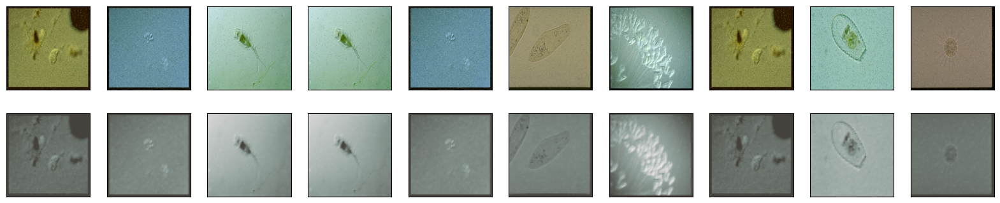

In [ ]:
# Training loop with gradient accumulation
accumulation_steps = 8
epochs = 50

for epoch in range(epochs):
    for i, data in enumerate(original_dataloader):
        img, clean_img = data
        img = img.to(device)
        clean_img = clean_img.to(device)

        optimizer.zero_grad()
        with torch.cuda.amp.autocast():
            output = model(img)
            loss = criterion(output, clean_img) / accumulation_steps

        scaler.scale(loss).backward()

        if (i + 1) % accumulation_steps == 0:
            scaler.step(optimizer)
            scaler.update()
            optimizer.zero_grad()

        torch.cuda.empty_cache()  # Free unused memory

        print(f"Epoch [{epoch+1}/{epochs}], Batch [{i+1}/{len(original_dataloader)}], Loss: {loss.item():.4f}")


# Prediction and display
specified_SPN_files = [
    'EMDS-6/EMDS5-Noise/g01/EMDS5-gg01-01-SPN_0.01.png',
    'EMDS-6/EMDS5-Noise/g02/EMDS5-gg02-01-SPN_0.01.png',
    'EMDS-6/EMDS5-Noise/g03/EMDS5-gg03-01-SPN_0.01.png',
    'EMDS-6/EMDS5-Noise/g04/EMDS5-gg04-01-SPN_0.03.png',
    'EMDS-6/EMDS5-Noise/g05/EMDS5-gg05-01-SPN_0.03.png',
    'EMDS-6/EMDS5-Noise/g06/EMDS5-gg06-01-SPN_0.01.png',
    'EMDS-6/EMDS5-Noise/g07/EMDS5-gg07-01-SPN_0.03.png',
    'EMDS-6/EMDS5-Noise/g08/EMDS5-gg08-01-SPN_0.01.png',
    'EMDS-6/EMDS5-Noise/g09/EMDS5-gg09-01-SPN_0.01.png',
    'EMDS-6/EMDS5-Noise/g10/EMDS5-gg10-01-SPN_0.03.png'
]

def preprocess_SPN_image(file_path):
    image = Image.open(file_path).convert('RGB')
    image = transform(image)
    return image

SPN_images = torch.stack([preprocess_SPN_image(f) for f in specified_SPN_files]).to(device)

model.eval()
with torch.no_grad():
    SPN_predictions = model(SPN_images).cpu().numpy()

# Convert predictions to displayable format
SPN_images = SPN_images.cpu().numpy()
SPN_images = np.transpose(SPN_images, (0, 2, 3, 1))  # (B, C, H, W) -> (B, H, W, C)
SPN_predictions = torch.sigmoid(torch.tensor(SPN_predictions)).numpy()  # Apply Sigmoid to logits
SPN_predictions = np.transpose(SPN_predictions, (0, 2, 3, 1))

# Clip values to ensure they are in the range [0, 1]
SPN_images = np.clip(SPN_images, 0, 1)
SPN_predictions = np.clip(SPN_predictions, 0, 1)

# Convert to uint8 for display
SPN_images = (SPN_images * 255).astype(np.uint8)
SPN_predictions = (SPN_predictions * 255).astype(np.uint8)

# Function to display images
def display(array1, array2, n=10):
    """Displays n random images from each array."""
    n = min(n, len(array1), len(array2))
    indices = np.random.randint(len(array1), size=n)
    plt.figure(figsize=(20, 4))
    for i, index in enumerate(indices):

        ax = plt.subplot(2, n, i + 1)
        plt.imshow(array1[index])
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)

        ax = plt.subplot(2, n, i + 1 + n)
        plt.imshow(array2[index])
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)

    plt.show()

# Display the results
display(SPN_images, SPN_predictions)

###### PGN

Epoch [1/50], Batch [1/840], Loss: 0.0821
Epoch [1/50], Batch [2/840], Loss: 0.0790
Epoch [1/50], Batch [3/840], Loss: 0.0752
Epoch [1/50], Batch [4/840], Loss: 0.0771
Epoch [1/50], Batch [5/840], Loss: 0.0857
Epoch [1/50], Batch [6/840], Loss: 0.0583
Epoch [1/50], Batch [7/840], Loss: 0.0492
Epoch [1/50], Batch [8/840], Loss: 0.0855
Epoch [1/50], Batch [9/840], Loss: 0.0711
Epoch [1/50], Batch [10/840], Loss: 0.0778
Epoch [1/50], Batch [11/840], Loss: 0.0764
Epoch [1/50], Batch [12/840], Loss: 0.0840
Epoch [1/50], Batch [13/840], Loss: 0.0838
Epoch [1/50], Batch [14/840], Loss: 0.0817
Epoch [1/50], Batch [15/840], Loss: 0.0812
Epoch [1/50], Batch [16/840], Loss: 0.0809
Epoch [1/50], Batch [17/840], Loss: 0.0748
Epoch [1/50], Batch [18/840], Loss: 0.0857
Epoch [1/50], Batch [19/840], Loss: 0.0799
Epoch [1/50], Batch [20/840], Loss: 0.0801
Epoch [1/50], Batch [21/840], Loss: 0.0747
Epoch [1/50], Batch [22/840], Loss: 0.0776
Epoch [1/50], Batch [23/840], Loss: 0.0841
Epoch [1/50], Batch 

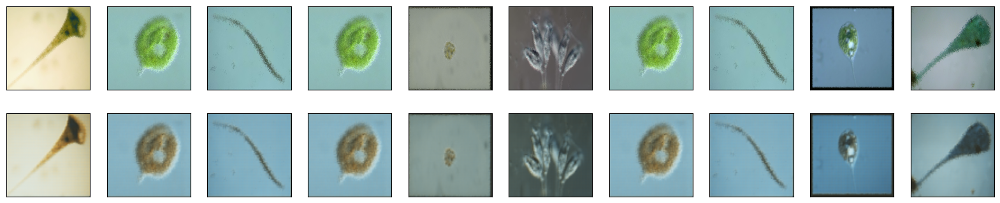

In [ ]:
# Training loop with gradient accumulation
accumulation_steps = 8
epochs = 50

for epoch in range(epochs):
    for i, data in enumerate(original_dataloader):
        img, clean_img = data
        img = img.to(device)
        clean_img = clean_img.to(device).float()

        optimizer.zero_grad()
        with torch.cuda.amp.autocast():
            output = model(img)
            loss = criterion(output, clean_img) / accumulation_steps

        scaler.scale(loss).backward()

        if (i + 1) % accumulation_steps == 0:
            scaler.step(optimizer)
            scaler.update()
            optimizer.zero_grad()

        torch.cuda.empty_cache()

        print(f"Epoch [{epoch+1}/{epochs}], Batch [{i+1}/{len(original_dataloader)}], Loss: {loss.item():.4f}")

# Prediction and display
specified_PGN_files = [
    'EMDS-6/EMDS5-Noise/g01/EMDS5-gg01-02-PGN.png',
    'EMDS-6/EMDS5-Noise/g14/EMDS5-gg14-37-PGN.png',
    'EMDS-6/EMDS5-Noise/g06/EMDS5-gg06-23-PGN.png',
    'EMDS-6/EMDS5-Noise/g10/EMDS5-gg10-16-PGN.png',
    'EMDS-6/EMDS5-Noise/g19/EMDS5-gg19-24-PGN.png',
    'EMDS-6/EMDS5-Noise/g13/EMDS5-gg13-01-PGN.png',
    'EMDS-6/EMDS5-Noise/g13/EMDS5-gg13-08-PGN.png',
    'EMDS-6/EMDS5-Noise/g14/EMDS5-gg14-12-PGN.png',
    'EMDS-6/EMDS5-Noise/g13/EMDS5-gg13-12-PGN.png',
    'EMDS-6/EMDS5-Noise/g19/EMDS5-gg19-06-PGN.png'
]

def preprocess_PGN_image(file_path):
    image = Image.open(file_path).convert('RGB')
    image = transform(image)
    return image

PGN_images = torch.stack([preprocess_PGN_image(f) for f in specified_PGN_files]).to(device)

model.eval()
with torch.no_grad():
    PGN_predictions = model(PGN_images).cpu().numpy()

# Convert predictions to displayable format
PGN_images = PGN_images.cpu().numpy()
PGN_images = np.transpose(PGN_images, (0, 2, 3, 1))
PGN_predictions = torch.sigmoid(torch.tensor(PGN_predictions))
PGN_predictions = np.transpose(PGN_predictions, (0, 2, 3, 1))

# Clip values to ensure they are in the range [0, 1]
PGN_images = np.clip(PGN_images, 0, 1)
PGN_predictions = np.clip(PGN_predictions, 0, 1)

# Convert to uint8 for display
PGN_images = (PGN_images * 255).astype(np.uint8)
PGN_predictions = (PGN_predictions.numpy() * 255).astype(np.uint8)

# Function to display images
def display(array1, array2, n=10):
    n = min(n, len(array1), len(array2))
    indices = np.random.randint(len(array1), size=n)
    plt.figure(figsize=(20, 4))
    for i, index in enumerate(indices):
        ax = plt.subplot(2, n, i + 1)
        plt.imshow(array1[index])
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)
        ax = plt.subplot(2, n, i + 1 + n)
        plt.imshow(array2[index])
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)
    plt.show()

# Display the results
display(PGN_images, PGN_predictions)

###### GN

Epoch [1/50], Batch [1/840], Loss: 0.0786
Epoch [1/50], Batch [2/840], Loss: 0.0838
Epoch [1/50], Batch [3/840], Loss: 0.0803
Epoch [1/50], Batch [4/840], Loss: 0.0718
Epoch [1/50], Batch [5/840], Loss: 0.0830
Epoch [1/50], Batch [6/840], Loss: 0.0564
Epoch [1/50], Batch [7/840], Loss: 0.0822
Epoch [1/50], Batch [8/840], Loss: 0.0838
Epoch [1/50], Batch [9/840], Loss: 0.0731
Epoch [1/50], Batch [10/840], Loss: 0.0780
Epoch [1/50], Batch [11/840], Loss: 0.0835
Epoch [1/50], Batch [12/840], Loss: 0.0715
Epoch [1/50], Batch [13/840], Loss: 0.0423
Epoch [1/50], Batch [14/840], Loss: 0.0827
Epoch [1/50], Batch [15/840], Loss: 0.0853
Epoch [1/50], Batch [16/840], Loss: 0.0835
Epoch [1/50], Batch [17/840], Loss: 0.0802
Epoch [1/50], Batch [18/840], Loss: 0.0822
Epoch [1/50], Batch [19/840], Loss: 0.0794
Epoch [1/50], Batch [20/840], Loss: 0.0848
Epoch [1/50], Batch [21/840], Loss: 0.0810
Epoch [1/50], Batch [22/840], Loss: 0.0815
Epoch [1/50], Batch [23/840], Loss: 0.0838
Epoch [1/50], Batch 

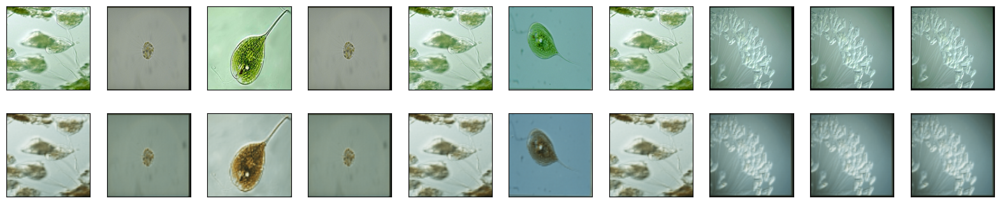

In [ ]:
# Training loop with gradient accumulation
accumulation_steps = 8
epochs = 50

for epoch in range(epochs):
    for i, data in enumerate(original_dataloader):
        img, clean_img = data
        img = img.to(device)
        clean_img = clean_img.to(device).float()  # Ensure the clean image is also float

        optimizer.zero_grad()
        with torch.cuda.amp.autocast():
            output = model(img)
            loss = criterion(output, clean_img) / accumulation_steps

        scaler.scale(loss).backward()

        if (i + 1) % accumulation_steps == 0:
            scaler.step(optimizer)
            scaler.update()
            optimizer.zero_grad()

        torch.cuda.empty_cache()  # Free unused memory

        print(f"Epoch [{epoch+1}/{epochs}], Batch [{i+1}/{len(original_dataloader)}], Loss: {loss.item():.4f}")

# Prediction and display
specified_GN_files = [
    'EMDS-6/EMDS5-Noise/g01/EMDS5-gg01-02-GN_0.03-0.5.png',
    'EMDS-6/EMDS5-Noise/g01/EMDS5-gg01-02-GN_0.01-0.5.png',
    'EMDS-6/EMDS5-Noise/g06/EMDS5-gg06-01-GN_0.01-0.5.png',
    'EMDS-6/EMDS5-Noise/g10/EMDS5-gg10-39-GN_0.01-0.png',
    'EMDS-6/EMDS5-Noise/g19/EMDS5-gg19-01-GN_0.01-0.png',
    'EMDS-6/EMDS5-Noise/g13/EMDS5-gg13-01-GN_0.03-0.5.png',
    'EMDS-6/EMDS5-Noise/g13/EMDS5-gg13-01-GN_0.01-0.png',
    'EMDS-6/EMDS5-Noise/g14/EMDS5-gg14-01-GN_0.01-0.5.png',
    'EMDS-6/EMDS5-Noise/g13/EMDS5-gg13-01-GN_0.01-0.5.png',
    'EMDS-6/EMDS5-Noise/g19/EMDS5-gg19-40-GN_0.01-0.png'
]

def preprocess_GN_image(file_path):
    image = Image.open(file_path).convert('RGB')
    image = transform(image)
    return image

GN_images = torch.stack([preprocess_GN_image(f) for f in specified_GN_files]).to(device)

model.eval()
with torch.no_grad():
    GN_predictions = model(GN_images).cpu().numpy()

# Convert predictions to displayable format
GN_images = GN_images.cpu().numpy()
GN_images = np.transpose(GN_images, (0, 2, 3, 1))  # (B, C, H, W) -> (B, H, W, C)
GN_predictions = torch.sigmoid(torch.tensor(GN_predictions))
GN_predictions = np.transpose(GN_predictions, (0, 2, 3, 1))

# Clip values to ensure they are in the range [0, 1]
GN_images = np.clip(GN_images, 0, 1)
GN_predictions = np.clip(GN_predictions.numpy(), 0, 1)

# Convert to uint8 for display
GN_images = (GN_images * 255).astype(np.uint8)
GN_predictions = (GN_predictions * 255).astype(np.uint8)

# Function to display images
def display(array1, array2, n=10):
    """Displays n random images from each array."""
    n = min(n, len(array1), len(array2))
    indices = np.random.randint(len(array1), size=n)
    plt.figure(figsize=(20, 4))
    for i, index in enumerate(indices):

        ax = plt.subplot(2, n, i + 1)
        plt.imshow(array1[index])
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)

        ax = plt.subplot(2, n, i + 1 + n)
        plt.imshow(array2[index])
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)

    plt.show()

# Display the results
display(GN_images, GN_predictions)

### Image Classification
#### Methods
CNN is used in classification to extract features from images since it has been proven that works well in image classification. 



In [ ]:
import os
import numpy as np
import tensorflow as tf
from PIL import Image
from tensorflow.keras.layers import Input, Dense, Reshape, Flatten, Dropout, BatchNormalization, LeakyReLU, Conv2D, Conv2DTranspose
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.optimizers.legacy import Adam

In [ ]:
import tensorflow as tf
from tensorflow.keras.preprocessing import image_dataset_from_directory
from tensorflow.keras.applications import Xception
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam

def rgb_to_grayscale(x):
    # Convert RGB image to grayscale using the TensorFlow function
    # Convert RGB image to grayscale
    x = tf.image.rgb_to_grayscale(x)
    # Replicate grayscale image across three channels
    x = tf.tile(x, [1, 1, 1, 3])
    return x

import os
import pandas as pd
from sklearn.model_selection import train_test_split

def create_dataset_df(data_dir):
    data = []
    classes = sorted(os.listdir(data_dir))
    for class_name in classes:
        class_dir = os.path.join(data_dir, class_name)
        if os.path.isdir(class_dir):
            for file in os.listdir(class_dir):
                data.append((os.path.join(class_dir, file), class_name))
    return pd.DataFrame(data, columns=['filepath', 'label'])

data_dir = '/content/drive/MyDrive/EMDS5-Original'
df = create_dataset_df(data_dir)

train_df, temp_df = train_test_split(df, test_size=0.625, stratify=df['label'], random_state=42)
valid_df, test_df = train_test_split(temp_df, test_size=0.6, stratify=temp_df['label'], random_state=42)

print("Training set size:", len(train_df))
print("Validation set size:", len(valid_df))
print("Test set size:", len(test_df))

import tensorflow as tf

def load_dataset_from_dataframe(df, batch_size, shuffle=True):
    datagen = tf.keras.preprocessing.image.ImageDataGenerator(
        rescale=1./255
    )
    dataset = datagen.flow_from_dataframe(
        dataframe=df,
        x_col='filepath',
        y_col='label',
        target_size=(299, 299),
        class_mode='categorical',
        batch_size=batch_size,
        shuffle=shuffle,
        seed=42
    )
    return dataset

batch_size = 32
train_dataset = load_dataset_from_dataframe(train_df, batch_size)
valid_dataset = load_dataset_from_dataframe(valid_df, batch_size)
test_dataset = load_dataset_from_dataframe(test_df, batch_size, False)


Training set size: 315
Validation set size: 210
Test set size: 315
Found 315 validated image filenames belonging to 21 classes.
Found 210 validated image filenames belonging to 21 classes.
Found 315 validated image filenames belonging to 21 classes.


In [ ]:
import os

import pandas as pd

def countClass(df):
  df['class'] = df['filepath'].str.extract(r'-(g\d+)-')

  class_counts = df['class'].value_counts()
  print(class_counts)

countClass(train_df)
countClass(valid_df)
countClass(test_df)


class
g18    15
g21    15
g11    15
g20    15
g10    15
g15    15
g06    15
g09    15
g16    15
g07    15
g08    15
g02    15
g19    15
g12    15
g14    15
g04    15
g03    15
g01    15
g17    15
g05    15
g13    15
Name: count, dtype: int64
class
g19    10
g08    10
g03    10
g06    10
g21    10
g12    10
g04    10
g01    10
g17    10
g07    10
g05    10
g18    10
g14    10
g09    10
g11    10
g15    10
g16    10
g10    10
g13    10
g20    10
g02    10
Name: count, dtype: int64
class
g21    15
g18    15
g03    15
g02    15
g07    15
g11    15
g08    15
g16    15
g06    15
g20    15
g17    15
g19    15
g10    15
g09    15
g15    15
g04    15
g12    15
g01    15
g13    15
g05    15
g14    15
Name: count, dtype: int64


In [ ]:
data_augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomFlip('horizontal_and_vertical'),  # Flips both horizontally and vertically
    tf.keras.layers.RandomRotation([0.25, 0.75]),  # Rotations of 90° to 270°
    tf.keras.layers.Resizing(299, 299)  # Resizes the images to 299 x 299 pixels
])

Xception

In [ ]:
base_Xception_model = Xception(weights='imagenet', include_top=False)

for layer in base_Xception_model.layers:
    layer.trainable = False

inputs = tf.keras.Input(shape=(299, 299, 3))
x = data_augmentation(inputs)
x = base_Xception_model(x, training=False)
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
outputs = Dense(len(train_dataset.class_indices), activation='softmax')(x)

Xception_model = Model(inputs, outputs)

Xception_model.compile(optimizer=Adam(learning_rate=0.002), loss='categorical_crossentropy', metrics=['accuracy'])

Xception_model.fit(
    train_dataset,
    validation_data=valid_dataset,
    epochs=15,
    callbacks=[tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=3)]
)

results = Xception_model.evaluate(test_dataset)
print(f"Test Loss: {results[0]}")
print(f"Test Accuracy: {results[1]}")

Epoch 1/15
10/10 ━━━━━━━━━━━━━━━━━━━━ 17s 963ms/step - accuracy: 0.1979 - loss: 2.8409 - val_accuracy: 0.5476 - val_loss: 1.5255
Epoch 2/15
10/10 ━━━━━━━━━━━━━━━━━━━━ 19s 2s/step - accuracy: 0.7030 - loss: 1.0067 - val_accuracy: 0.6429 - val_loss: 1.0856
Epoch 3/15
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 710ms/step - accuracy: 0.8835 - loss: 0.4529 - val_accuracy: 0.6857 - val_loss: 0.9312
Epoch 4/15
10/10 ━━━━━━━━━━━━━━━━━━━━ 12s 895ms/step - accuracy: 0.8901 - loss: 0.3500 - val_accuracy: 0.7238 - val_loss: 0.9281
Epoch 5/15
10/10 ━━━━━━━━━━━━━━━━━━━━ 21s 870ms/step - accuracy: 0.8994 - loss: 0.2907 - val_accuracy: 0.7619 - val_loss: 0.8646
Epoch 6/15
10/10 ━━━━━━━━━━━━━━━━━━━━ 18s 733ms/step - accuracy: 0.9354 - loss: 0.2473 - val_accuracy: 0.7429 - val_loss: 0.7864
Epoch 7/15
10/10 ━━━━━━━━━━━━━━━━━━━━ 12s 887ms/step - accuracy: 0.9733 - loss: 0.1156 - val_accuracy: 0.7810 - val_loss: 0.7817
Epoch 8/15
10/10 ━━━━━━━━━━━━━━━━━━━━ 19s 673ms/step - accuracy: 0.9888 - loss: 0.0994 - val_accurac

10/10 ━━━━━━━━━━━━━━━━━━━━ 7s 573ms/step
Accuracy: 0.7682539682539683
Precision: 0.8045739765664579
Recall: 0.7682539682539682
F1-score: 0.7699783538560518
Average Precision (AP): 0.8839190316093699


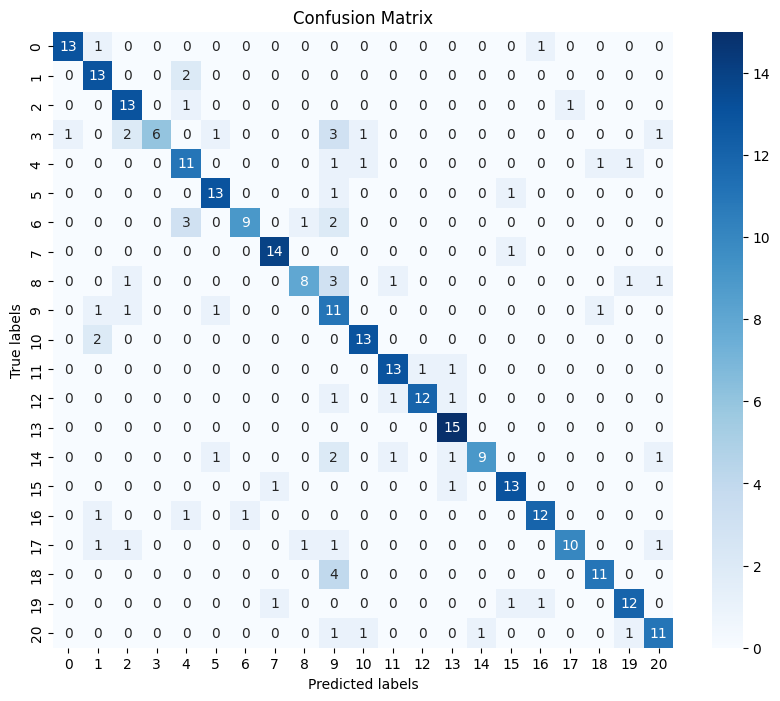

In [ ]:
import numpy as np
from sklearn.metrics import precision_score, recall_score, f1_score, average_precision_score
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming 'test_dataset' is your DataFrameIterator and 'model' is your trained model
predictions = Xception_model.predict(test_dataset)
predicted_classes = predictions.argmax(axis=1)  # Get the class index with the highest probability

true_classes = test_dataset.classes  # This gives you the true class indices directly

from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, average_precision_score

# Compute metrics
accuracy_result = accuracy_score(true_classes, predicted_classes)
precision = precision_score(true_classes, predicted_classes, average='macro')  # 'macro' ignores class imbalance
recall = recall_score(true_classes, predicted_classes, average='macro')
f1 = f1_score(true_classes, predicted_classes, average='macro')

# For Average Precision, we need probability scores and a binary format for true labels
# Since we're using 'macro', it averages the AP over classes
average_precision = average_precision_score(tf.keras.utils.to_categorical(true_classes, num_classes=len(train_dataset.class_indices)), predictions, average='macro')

print(f"Accuracy: {accuracy_result}")
print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"F1-score: {f1}")
print(f"Average Precision (AP): {average_precision}")

confusion_mtx = tf.math.confusion_matrix(true_classes, predicted_classes, num_classes=21)
plt.figure(figsize=(10, 8))
sns.heatmap(confusion_mtx, annot=True, fmt='g', cmap='Blues')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix')
plt.show()


After appling the data argumentation method we achieved Accuracy at 76%

10/10 [==============================] - 5s 362ms/step
Accuracy: 0.7396825396825397
Precision: 0.812791512979293
Recall: 0.7396825396825396
F1-score: 0.7471920446271797
Average Precision (AP): 0.8609397030780983


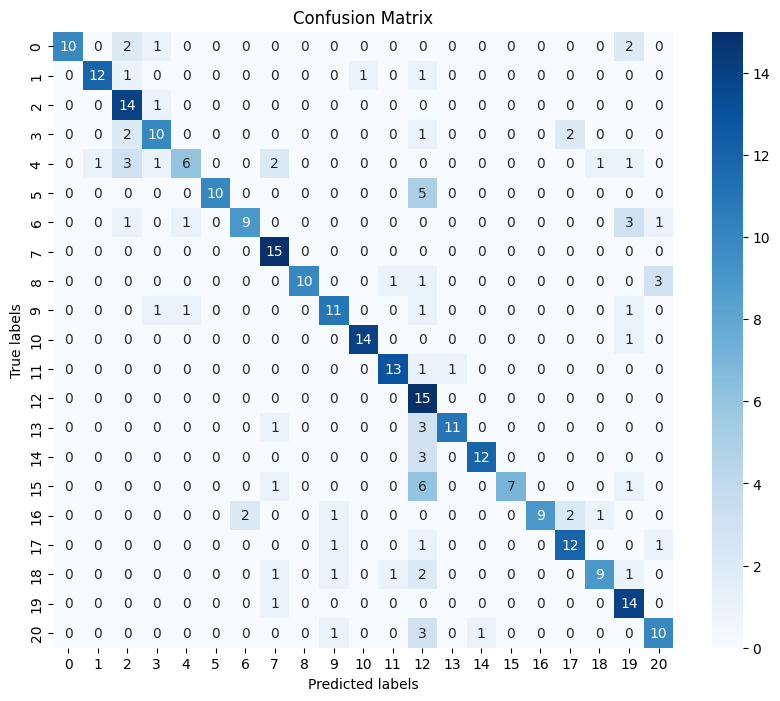

In [ ]:
# Assuming 'test_dataset' is your DataFrameIterator and 'model' is your trained model
predictions = Inception_model.predict(test_dataset)
predicted_classes = predictions.argmax(axis=1)  # Get the class index with the highest probability

true_classes = test_dataset.classes  # This gives you the true class indices directly

from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, average_precision_score

# Compute metrics
accuracy_result = accuracy_score(true_classes, predicted_classes)
precision = precision_score(true_classes, predicted_classes, average='macro')  # 'macro' ignores class imbalance
recall = recall_score(true_classes, predicted_classes, average='macro')
f1 = f1_score(true_classes, predicted_classes, average='macro')

# For Average Precision, we need probability scores and a binary format for true labels
# Since we're using 'macro', it averages the AP over classes
average_precision = average_precision_score(tf.keras.utils.to_categorical(true_classes, num_classes=len(train_dataset.class_indices)), predictions, average='macro')

print(f"Accuracy: {accuracy_result}")
print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"F1-score: {f1}")
print(f"Average Precision (AP): {average_precision}")
confusion_mtx = tf.math.confusion_matrix(true_classes, predicted_classes, num_classes=21)
plt.figure(figsize=(10, 8))
sns.heatmap(confusion_mtx, annot=True, fmt='g', cmap='Blues')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix')
plt.show()

After appling the data argumentation method, using Inception model we achieved Accuracy at 73%, Precision at 81%, Recall at 73%, F1-score at 74%.

Since we found that different model has their advantage on different class’ classifications, therefore the fusion model is created to take advantage of two base pre-train models. In the next step we will apply feature fusion method and see how does that perfrom under our dataset.

In [ ]:
import tensorflow as tf
from tensorflow.keras.applications import InceptionV3, Xception
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Concatenate
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam

base_inception = InceptionV3(weights='imagenet', include_top=False, input_shape=(299, 299, 3))
base_xception = Xception(weights='imagenet', include_top=False, input_shape=(299, 299, 3))

for layer in base_inception.layers:
    layer.trainable = False
for layer in base_xception.layers:
    layer.trainable = False

inputs = tf.keras.Input(shape=(299, 299, 3))
x = data_augmentation(inputs)

features_inception = base_inception(x, training=False)
features_xception = base_xception(x, training=False)

pooled_features_inception = GlobalAveragePooling2D()(features_inception)
pooled_features_xception = GlobalAveragePooling2D()(features_xception)

merged_features = Concatenate()([pooled_features_inception, pooled_features_xception])

x = Dense(1024, activation='relu')(merged_features)
outputs = Dense(len(train_dataset.class_indices), activation='softmax')(x)

features_fution_model = Model(inputs, outputs)

features_fution_model.compile(optimizer=Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

features_fution_model.summary()

features_fution_model.fit(
    train_dataset,
    validation_data=valid_dataset,
    epochs=15,
    callbacks=[tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=3)]
)


Model: "model_7"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_23 (InputLayer)       [(None, 299, 299, 3)]        0         []                            
                                                                                                  
 sequential_2 (Sequential)   (None, 299, 299, None)       0         ['input_23[0][0]']            
                                                                                                  
 inception_v3 (Functional)   (None, 8, 8, 2048)           2180278   ['sequential_2[5][0]']        
                                                          4                                       
                                                                                                  
 xception (Functional)       (None, 10, 10, 2048)         2086148   ['sequential_2[5][0]']  

10/10 [==============================] - 8s 651ms/step - loss: 0.7295 - accuracy: 0.8095
Test Loss: 0.7294767498970032
Test Accuracy: 0.8095238208770752
10/10 [==============================] - 8s 496ms/step
Accuracy: 0.8095238095238095
Precision: 0.825118299067879
Recall: 0.8095238095238095
F1-score: 0.8112368387488893
Average Precision (AP): 0.8871279070933528


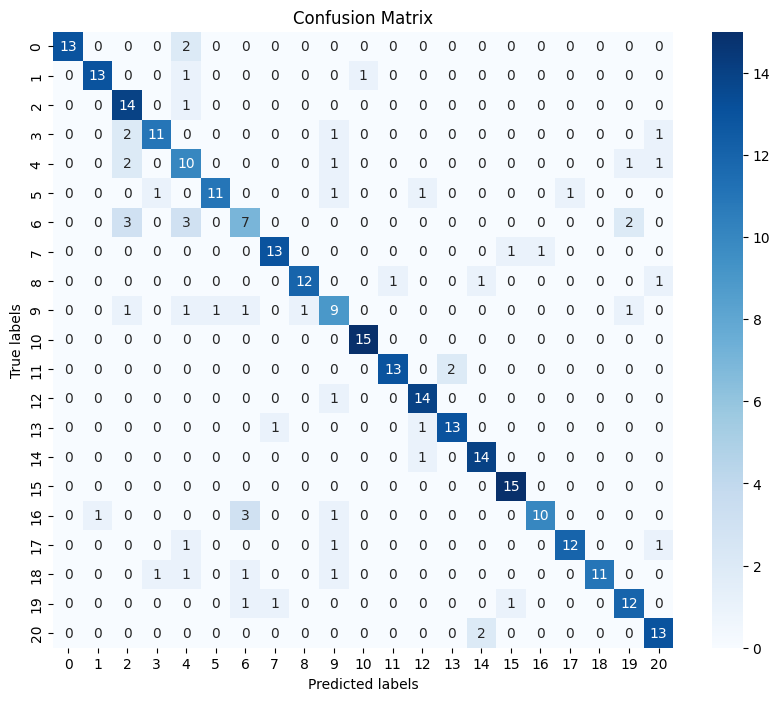

In [ ]:
results = features_fution_model.evaluate(test_dataset)
print(f"Test Loss: {results[0]}")
print(f"Test Accuracy: {results[1]}")

# Assuming 'test_dataset' is your DataFrameIterator and 'model' is your trained model
predictions = features_fution_model.predict(test_dataset)
predicted_classes = predictions.argmax(axis=1)  # Get the class index with the highest probability

true_classes = test_dataset.classes  # This gives you the true class indices directly

# Compute metrics
accuracy_result = accuracy_score(true_classes, predicted_classes)
precision = precision_score(true_classes, predicted_classes, average='macro')  # 'macro' ignores class imbalance
recall = recall_score(true_classes, predicted_classes, average='macro')
f1 = f1_score(true_classes, predicted_classes, average='macro')

# For Average Precision, we need probability scores and a binary format for true labels
# Since we're using 'macro', it averages the AP over classes
average_precision = average_precision_score(tf.keras.utils.to_categorical(true_classes, num_classes=len(train_dataset.class_indices)), predictions, average='macro')

print(f"Accuracy: {accuracy_result}")
print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"F1-score: {f1}")
print(f"Average Precision (AP): {average_precision}")
confusion_mtx = tf.math.confusion_matrix(true_classes, predicted_classes, num_classes=21)
plt.figure(figsize=(10, 8))
sns.heatmap(confusion_mtx, annot=True, fmt='g', cmap='Blues')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix')
plt.show()

In [ ]:
from tensorflow.keras.applications import MobileNetV2

base_mobilenet = MobileNetV2(weights='imagenet', include_top=False, input_shape=(299, 299, 3))

for layer in base_mobilenet.layers:
    layer.trainable = False

inputs = tf.keras.Input(shape=(299, 299, 3))
x = data_augmentation(inputs)
x = base_mobilenet(inputs, training=False)
x = GlobalAveragePooling2D()(x)
outputs = Dense(21, activation='softmax')(x)

mobilenet_model = Model(inputs, outputs)

mobilenet_model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

mobilenet_model.summary()

mobilenet_model.fit(
    train_dataset,
    validation_data=valid_dataset,
    epochs=30,
    callbacks=[tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=3)]
)


9406464/9406464 [==============================] - 0s 0us/step
Model: "model_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_25 (InputLayer)       [(None, 299, 299, 3)]     0         
                                                                 
 mobilenetv2_1.00_224 (Func  (None, 10, 10, 1280)      2257984   
 tional)                                                         
                                                                 
 global_average_pooling2d_1  (None, 1280)              0         
 2 (GlobalAveragePooling2D)                                      
                                                                 
 dense_19 (Dense)            (None, 21)                26901     
                                                                 
Total params: 2284885 (8.72 MB)
Trainable params: 26901 (105.08 KB)
Non-trainable params: 2257984 (8.61 MB)
____________________

10/10 [==============================] - 6s 561ms/step - loss: 0.6594 - accuracy: 0.8095
Test Loss: 0.6593726873397827
Test Accuracy: 0.8095238208770752
10/10 [==============================] - 5s 449ms/step
Accuracy: 0.8095238095238095
Precision: 0.8192380487548554
Recall: 0.8095238095238095
F1-score: 0.8070452679188058
Average Precision (AP): 0.8818038519026239


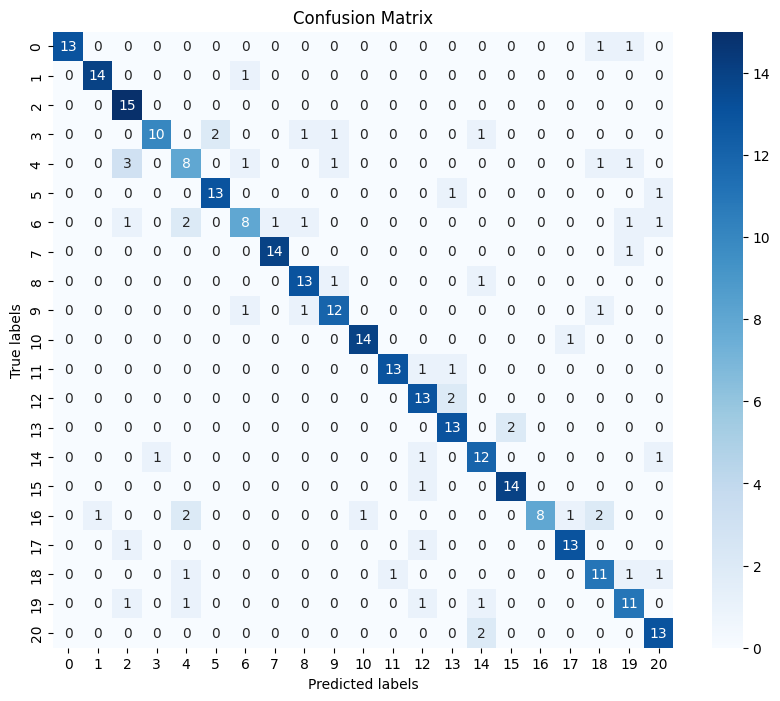

In [ ]:
results = mobilenet_model.evaluate(test_dataset)
print(f"Test Loss: {results[0]}")
print(f"Test Accuracy: {results[1]}")

# Assuming 'test_dataset' is your DataFrameIterator and 'model' is your trained model
predictions = mobilenet_model.predict(test_dataset)
predicted_classes = predictions.argmax(axis=1)  # Get the class index with the highest probability

true_classes = test_dataset.classes  # This gives you the true class indices directly

# Compute metrics
accuracy_result = accuracy_score(true_classes, predicted_classes)
precision = precision_score(true_classes, predicted_classes, average='macro')  # 'macro' ignores class imbalance
recall = recall_score(true_classes, predicted_classes, average='macro')
f1 = f1_score(true_classes, predicted_classes, average='macro')

# For Average Precision, we need probability scores and a binary format for true labels
# Since we're using 'macro', it averages the AP over classes
average_precision = average_precision_score(tf.keras.utils.to_categorical(true_classes, num_classes=len(train_dataset.class_indices)), predictions, average='macro')

print(f"Accuracy: {accuracy_result}")
print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"F1-score: {f1}")
print(f"Average Precision (AP): {average_precision}")
confusion_mtx = tf.math.confusion_matrix(true_classes, predicted_classes, num_classes=21)
plt.figure(figsize=(10, 8))
sns.heatmap(confusion_mtx, annot=True, fmt='g', cmap='Blues')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix')
plt.show()

Training set size: 315
Validation set size: 210
Test set size: 315
Found 315 validated image filenames belonging to 21 classes.
Found 210 validated image filenames belonging to 21 classes.
Found 315 validated image filenames belonging to 21 classes.
20/20 [==============================] - 12s 111ms/step


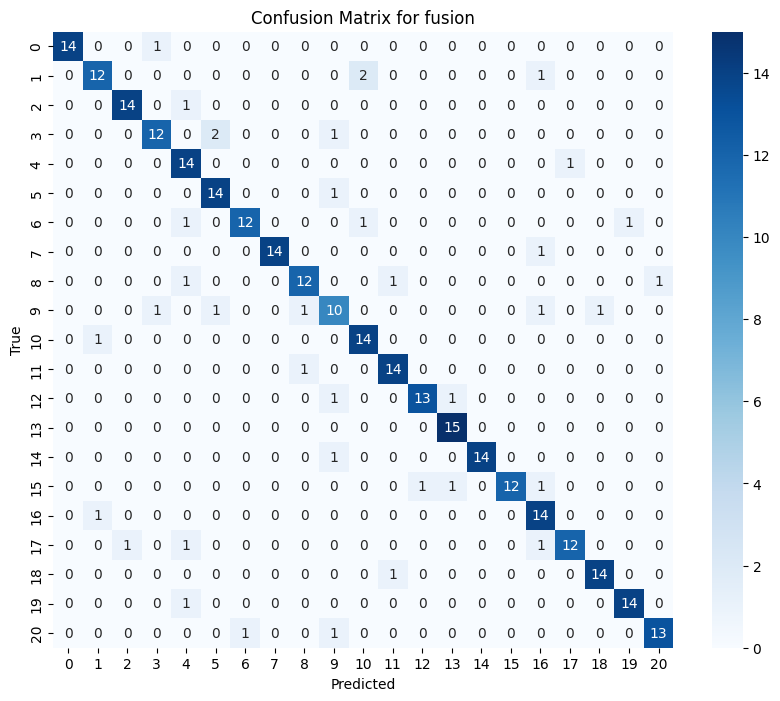

Training set size: 315
Validation set size: 210
Test set size: 315
Found 315 validated image filenames belonging to 21 classes.
Found 210 validated image filenames belonging to 21 classes.
Found 315 validated image filenames belonging to 21 classes.
20/20 [==============================] - 3s 101ms/step


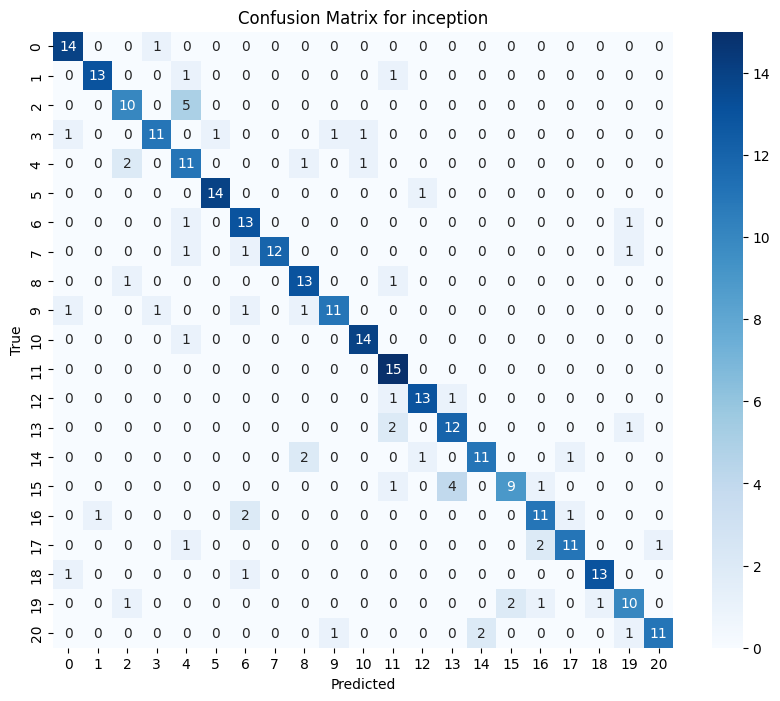

Training set size: 315
Validation set size: 210
Test set size: 315
Found 315 validated image filenames belonging to 21 classes.
Found 210 validated image filenames belonging to 21 classes.
Found 315 validated image filenames belonging to 21 classes.
20/20 [==============================] - 2s 88ms/step


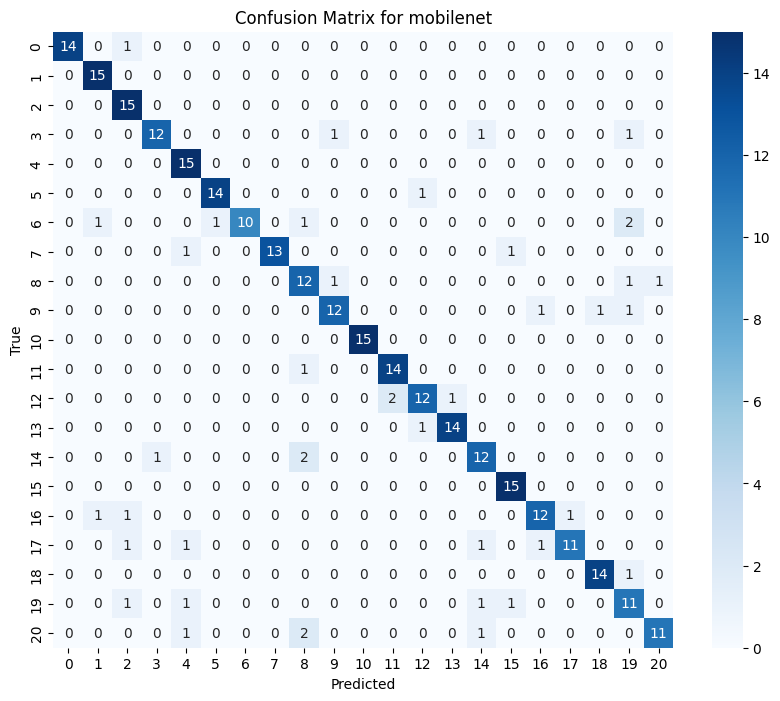

Training set size: 315
Validation set size: 210
Test set size: 315
Found 315 validated image filenames belonging to 21 classes.
Found 210 validated image filenames belonging to 21 classes.
Found 315 validated image filenames belonging to 21 classes.
20/20 [==============================] - 2s 87ms/step


c:\Users\Administrator\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


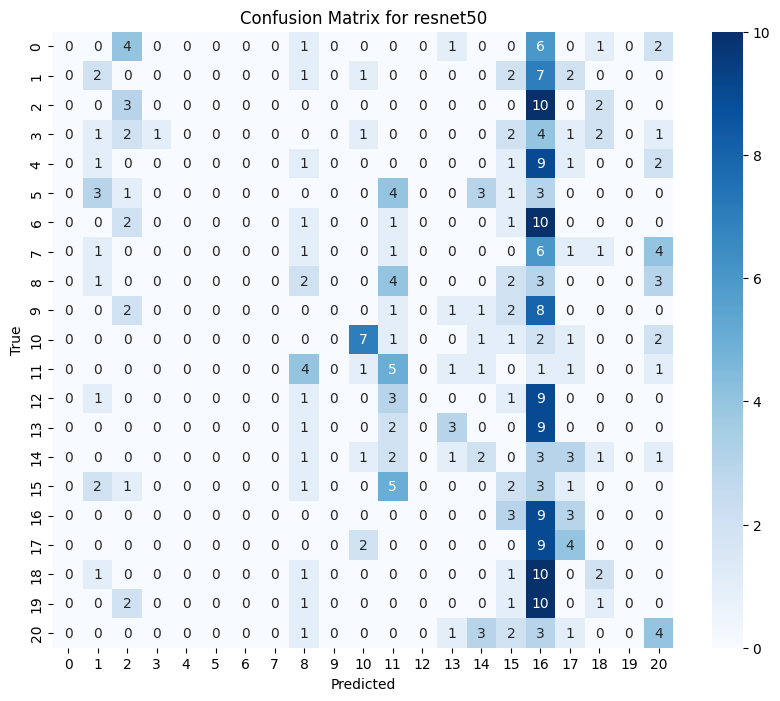

Training set size: 315
Validation set size: 210
Test set size: 315
Found 315 validated image filenames belonging to 21 classes.
Found 210 validated image filenames belonging to 21 classes.
Found 315 validated image filenames belonging to 21 classes.
20/20 [==============================] - 2s 98ms/step


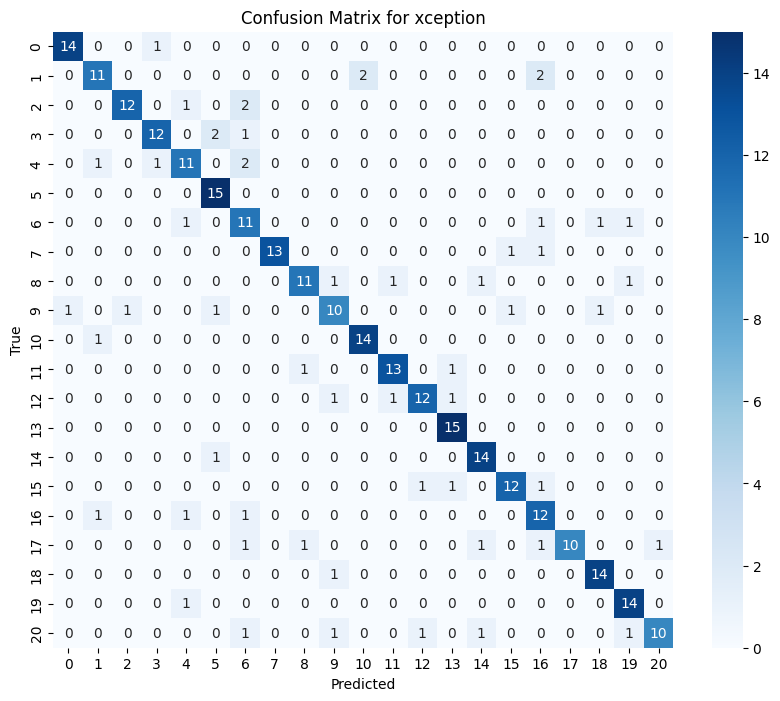

Evaluation results saved to 'evaluation_results.csv'


In [ ]:
import os
import pandas as pd
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
import tensorflow as tf
import matplotlib.pyplot as plt
import seaborn as sns

model_input_sizes = {
    'mobilenet': (224, 224, 3),
    'xception': (299, 299, 3),
    'inception': (299, 299, 3),
    'resnet50': (224, 224, 3),
    'fusion': (299, 299, 3)
}

def plot_confusion_matrix(cm, model_name):
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.title(f'Confusion Matrix for {model_name}')
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.show()  # Display the plot directly in the notebook
    plt.close()

def evaluate_models(data_dir, model_dir, create_and_load_original_datasets, model_input_sizes):
    # List to store evaluation results
    results = []

    # Loop over each model file in the specified directory
    for model_file in os.listdir(model_dir):
        if model_file.endswith('.h5') and ('False' in model_file or 'fusion' in model_file):
            model_path = os.path.join(model_dir, model_file)
            use_augmentation = 'True' in model_file  # Check if the model used augmentation
            model_name = model_file.split('_')[0].lower()  # Assuming model_name is the prefix in filename

            if model_name in model_input_sizes:
                input_shape = model_input_sizes[model_name]
                _, _, test_dataset = create_and_load_original_datasets(data_dir, 16, input_shape=input_shape[:2])

                # Load the model
                model = tf.keras.models.load_model(model_path)

                # Perform predictions with the model on the test dataset
                predictions = model.predict(test_dataset)
                predicted_classes = predictions.argmax(axis=1)  # Get the class index with the highest probability
                true_classes = test_dataset.classes  # This gives you the true class indices directly

                # Compute metrics
                accuracy_result = accuracy_score(true_classes, predicted_classes)
                precision = precision_score(true_classes, predicted_classes, average='macro')
                recall = recall_score(true_classes, predicted_classes, average='macro')
                f1 = f1_score(true_classes, predicted_classes, average='macro')

                # Compute and plot confusion matrix
                cm = confusion_matrix(true_classes, predicted_classes)
                plot_confusion_matrix(cm, model_name)
                
                # Append results to the list
                results.append({
                    'Model': model_file,
                    'Accuracy': accuracy_result,
                    'Precision': precision,
                    'Recall': recall,
                    'F1 Score': f1,
                    'Used Augmentation': use_augmentation
                })
            else:
                print(f"No input size found for {model_name}, skipping...")

    # Convert results to a DataFrame and save to CSV
    results_df = pd.DataFrame(results)
    results_df.to_csv(os.path.join(model_dir, 'evaluation_results.csv'), index=False)
    print("Evaluation results saved to 'evaluation_results.csv'")

    return results_df

# Paths for data and model directories
model_dir = 'models'
data_dir = r'./EMDS5-Original'
# Evaluate models and save results
evaluation_results = evaluate_models(data_dir, model_dir, create_and_load_original_datasets, model_input_sizes)


In [ ]:
evaluation_results

,Model,Accuracy,Precision,Recall,F1 Score,Used Augmentation
0,fusion_NetV2_xcep_original.h5,0.879365,0.886642,0.879365,0.880002,False
1,inception_epochs30_lr0.001_False.h5,0.800000,0.812759,0.800000,0.800841,False
2,mobilenet_epochs30_lr0.001_False.h5,0.866667,0.876677,0.866667,0.866453,False
3,resnet50_epochs30_lr0.001_False.h5,0.146032,0.165606,0.146032,0.122445,False
4,xception_epochs30_lr0.001_False.h5,0.825397,0.835646,0.825397,0.825107,False


Since we found that different model has their advantage on different class’ classifications, therefore the fusion model is created to take advantage of two base pre-train models. The fusion model combined with MobileNetV2 and Xception performs well. We fuse the feature extracted from these two models and then add custom layers, which almost give about 90% accuracy, the best performance classification model we have. 


### Image Segmentation
#### Methods
Our project used a pre-trained U-net model and albumentations library in image segmentation tasks.



In [ ]:
from collections import defaultdict
import copy
import random

import albumentations as A
import albumentations.augmentations.functional as F
from albumentations.pytorch import ToTensorV2
import cv2
import matplotlib.pyplot as plt
import numpy as np
import ternausnet.models
from tqdm import tqdm
import torch
import torch.backends.cudnn as cudnn
import torch.nn as nn
import torch.optim
from torch.utils.data import Dataset, DataLoader

from torchmetrics import Dice, Recall
from torchmetrics.classification import BinaryJaccardIndex, BinaryRecall

cudnn.benchmark = True

#### load and split data
Randomly select 37.5% of the dataset as the training set, 25% as the validation set, and 37.5% as the test set.

In [ ]:
masks_dir = '/content/drive/MyDrive/EMDS5-Ground Truth'
data_dir = '/content/drive/MyDrive/EMDS5-Original'
images_class_names = list(sorted(os.listdir(data_dir)))

# collect original EMDS-6 images and their corresponding Ground Truth images
train_images_filenames = []
val_images_filenames = []
test_images_filenames = []
mask_images_filenames = []
for class_name in images_class_names:
    class_dir = os.path.join(data_dir, class_name)
    file_count = 0
    for file in os.listdir(class_dir):
        filepath = os.path.join(class_dir, file)
        maskpath = filepath.replace(data_dir, masks_dir).replace('.png', '-GTM.png')
        if file_count < 15:
            train_images_filenames.append([filepath, maskpath])
        elif file_count < 25:
            val_images_filenames.append([filepath, maskpath])
        else:
            test_images_filenames.append([filepath, maskpath])
        file_count += 1

# We take 37.5% of the data as a training dataset, 25% as a validated dataset and 37.5% as a test dataset out of 840
print('training dataset:', len(train_images_filenames))
print('validate dataset:',len(val_images_filenames))
print('testing dataset:', len(test_images_filenames))

training dataset: 315
validate dataset: 210
testing dataset: 315


In [ ]:
def preprocess_mask(mask):
    """
    preprocess_mask preprocesses a mask.
    :params mask: A numpy array representing the mask.
    :return: A numpy array representing the preprocessed mask.
    """
    # Assume mask is loaded with cv2.IMREAD_UNCHANGED; ensure it is single-channel
    if len(mask.shape) == 3:  # i.e., mask has multiple channels
        mask = mask[:, :, 0]  # Use the first channel assuming it contains the relevant mask data
    return mask

In [ ]:
def display_image_grid(images_filenames, predicted_masks=None, figsize=(10, 24)):
    """
    display_image_grid displays a grid of images.
    :params images_filenames: A list of tuples representing the image and mask filenames.
    :params predicted_masks: A list of numpy arrays representing the predicted masks.
    :params figsize: A tuple representing the figure size.
    :return: None
    """
    cols = 3 if predicted_masks else 2
    rows = len(images_filenames)
    figure, ax = plt.subplots(nrows=rows, ncols=cols, figsize=figsize)
    for i, filenames in enumerate(images_filenames):
        image_filename, mask_filename = filenames
        image = cv2.imread(image_filename)
        # image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        mask = cv2.imread(mask_filename, cv2.IMREAD_UNCHANGED,)
        mask = preprocess_mask(mask)
        ax[i, 0].imshow(image)
        ax[i, 1].imshow(mask, interpolation="nearest")

        ax[i, 0].set_title("Image")
        ax[i, 1].set_title("Ground truth mask")

        ax[i, 0].set_axis_off()
        ax[i, 1].set_axis_off()

        if predicted_masks:
            predicted_mask = predicted_masks[i]
            ax[i, 2].imshow(predicted_mask, interpolation="nearest")
            ax[i, 2].set_title("Predicted mask")
            ax[i, 2].set_axis_off()
    plt.tight_layout()
    plt.show()

#### Dataset display


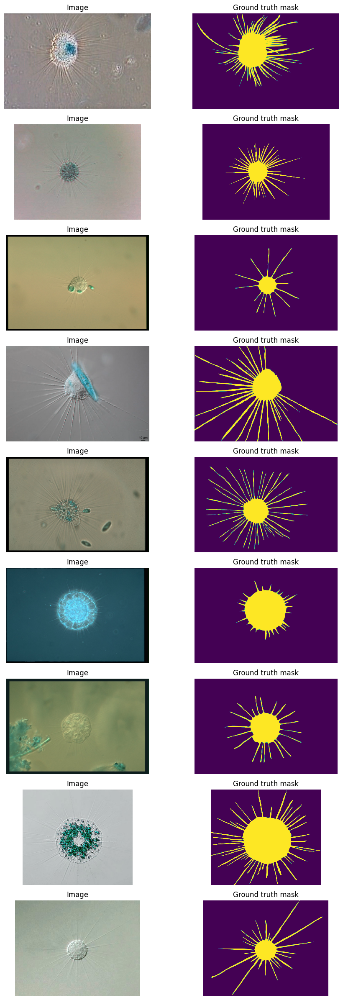

In [ ]:
display_image_grid(val_images_filenames[1:10])

#### data argumentation method display

In [ ]:
import cv2
from albumentations import Resize, PadIfNeeded, CenterCrop, Compose

# Define paths and filenames
example_image_filename = train_images_filenames[0]

# Read and convert image
image = cv2.imread(example_image_filename[0])
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Define the transformations
transformations_Resize = Compose([
    Resize(height=256, width=256, p=1),  # Resize the image to 256x256
])

transformations_Pad = Compose([
    PadIfNeeded(min_height=512, min_width=512, border_mode=cv2.BORDER_REFLECT, p=1),  # Pad to at least 512x512
])

transformations_Crop = Compose([
    CenterCrop(height=256, width=256, p=1)  # Crop the center to 256x256
])

# Apply transformations
transformed_Resize_image = transformations_Resize(image=image)
transformed_Resize_image = transformed_Resize_image['image']

transformed_Pad_image = transformations_Pad(image=image)
transformed_Pad_image = transformed_Pad_image['image']

transformed_Crop_image = transformations_Crop(image=image)
transformed_Crop_image = transformed_Crop_image['image']

# For demonstration, let's handle the padding with a constant value separately
pad_constant = Compose([
    PadIfNeeded(min_height=512, min_width=512, border_mode=cv2.BORDER_CONSTANT, value=(255, 255, 255), p=1)  # Padding with white border
])

# Apply constant padding
padded_constant_image = pad_constant(image=image)
padded_constant_image = padded_constant_image['image']


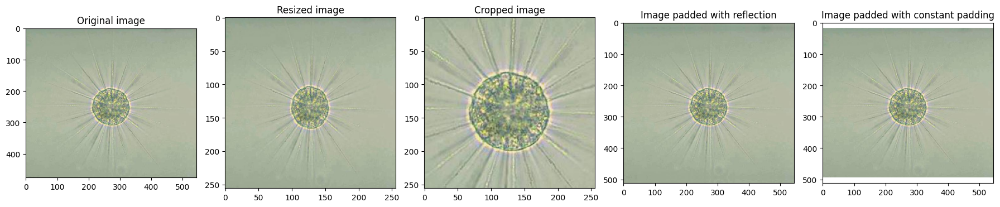

In [ ]:
figure, ax = plt.subplots(nrows=1, ncols=5, figsize=(18, 10))
ax.ravel()[0].imshow(image)
ax.ravel()[0].set_title("Original image")
ax.ravel()[1].imshow(transformed_Resize_image)
ax.ravel()[1].set_title("Resized image")
ax.ravel()[2].imshow(transformed_Crop_image)
ax.ravel()[2].set_title("Cropped image")
ax.ravel()[3].imshow(transformed_Pad_image)
ax.ravel()[3].set_title("Image padded with reflection")
ax.ravel()[4].imshow(padded_constant_image)
ax.ravel()[4].set_title("Image padded with constant padding")
plt.tight_layout()
plt.show()

Albumentations is a computer vision tool that boosts the performance of deep convolutional neural networks. Usually, the images in the dataset have different heights and widths and different aspect ratios which brings one of the most common challenges to deep learning projects: deep learning frameworks such as PyTorch require all images in a batch to have same height and width, even fully convolutional architectures such as UNet can work with images of all size.

Albumentations provides several methods to help us address this challenge: 1. Resize, 2. Crop Image, 3. Add Constant Paddings.

According to our dataset analysis, the maximum width and height among the 840 images are 1971px and 1525px, respectively. If we were to use the constant paddings method, our calculations indicate that we would need 92GB of memory to complete our training, which is beyond the capacity of the machines we have available. Furthermore, based on the image heatmap, not all images are perfectly centered, making the Crop Image method unsuitable. Therefore, we decided to uniformly apply the image resize method.

#### training and validation

In [ ]:
class EMDS6Dataset(Dataset):
    """
    EMDS6Dataset is a custom dataset class for the EMDS6 dataset.
    It loads images and their corresponding masks and applies transformations.
    :params images_filenames: A list of tuples representing the image and mask filenames.
    :params transform: A composition of albumentations transformations.
    """
    def __init__(self, images_filenames, transform=None):
        self.images_filenames = images_filenames
        self.transform = transform

    def __len__(self):
        return len(self.images_filenames)

    def __getitem__(self, idx):
        """
        __getitem__ loads an image and its corresponding mask and applies transformations.
        :params idx: The index of the sample to load.
        :return: A tuple containing the image and its corresponding mask.
        """
        image_filename, mask_filename = self.images_filenames[idx]
        image = cv2.imread(image_filename)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        mask = cv2.imread(mask_filename, cv2.IMREAD_UNCHANGED)
        mask = preprocess_mask(mask)
        if self.transform is not None:
            transformed = self.transform(image=image, mask=mask)
            image = transformed["image"]
            mask = transformed["mask"]
        return image, mask

In [ ]:
class EMDS6InferenceDataset(Dataset):
    """
    EMDS6InferenceDataset is a custom dataset class for the EMDS6 dataset.
    It loads images and their corresponding masks and applies transformations.
    The main difference between EMDS6Dataset and EMDS6InferenceDataset is that
    EMDS6InferenceDataset calculates the original size of the images and masks
    to support the collection of performance metrics.
    :params images_filenames: A list of tuples representing the image and mask filenames.
    :params transform: A composition of albumentations transformations.
    """
    def __init__(self, images_filenames, transform=None):
        self.images_filenames = images_filenames
        self.transform = transform

    def __len__(self):
        return len(self.images_filenames)

    def __getitem__(self, idx):
        """
        __getitem__ loads an image and its corresponding mask and applies transformations.
        :params idx: The index of the sample to load.
        :return: A tuple containing the image and its corresponding mask.
        """
        image_filename, mask_filename = self.images_filenames[idx]
        image = cv2.imread(image_filename)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        mask = cv2.imread(mask_filename, cv2.IMREAD_UNCHANGED)
        mask = preprocess_mask(mask)

        original_size = tuple(image.shape[:2])
        if self.transform is not None:
            transformed = self.transform(image=image, mask=mask)
            image = transformed["image"]
            mask = transformed["mask"]
        return image, mask, original_size

##### Visualization of Data augmentation

In [ ]:
def visualize_augmentations(dataset, idx=0, samples=5):
    dataset = copy.deepcopy(dataset)
    dataset.transform = A.Compose([t for t in dataset.transform if not isinstance(t, (A.Normalize, ToTensorV2))])
    figure, ax = plt.subplots(nrows=2, ncols=samples, figsize=(24, 10))
    for i in range(samples):
        image, mask = dataset[idx]
        ax[0, i].imshow(image)
        ax[1, i].imshow(mask, interpolation="nearest")
        ax[0, i].set_title("Augmented image")
        ax[1, i].set_title("Augmented mask")
        ax[0, i].set_axis_off()
        ax[1, i].set_axis_off()
    plt.tight_layout()
    plt.show()

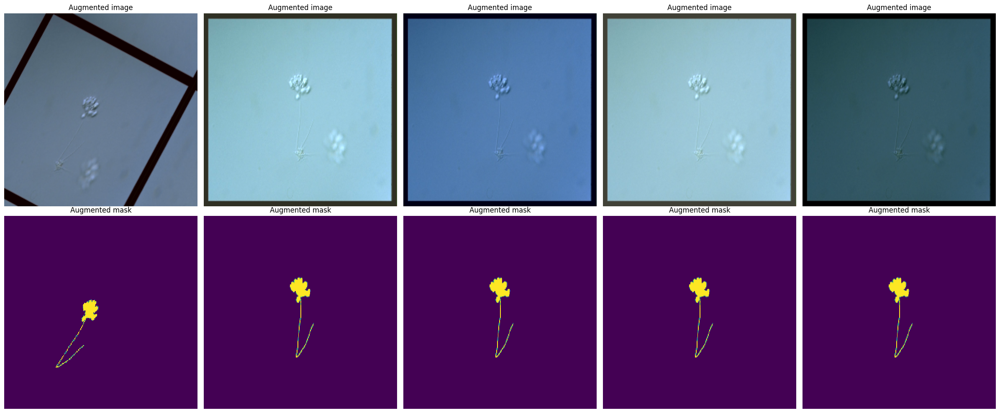

In [ ]:
random.seed(42)
visualize_augmentations(train_dataset, idx=55)

examples of a mix of data argumentation methods with associated GT images.

##### Define helpers for training

In [ ]:
class MetricMonitor:
    """
    MetricMonitor helps to track metrics such as accuracy or loss during training and validation..
    :params float_precision: The number of decimal places to round the metrics.
    """
    def __init__(self, float_precision=3):
        self.float_precision = float_precision
        self.reset()

    def reset(self):
        self.metrics = defaultdict(lambda: {"val": 0, "count": 0, "avg": 0})

    def update(self, metric_name, val):
        metric = self.metrics[metric_name]

        metric["val"] += val
        metric["count"] += 1
        metric["avg"] = metric["val"] / metric["count"]

    def __str__(self):
        return " | ".join(
            [
                "{metric_name}: {avg:.{float_precision}f}".format(
                    metric_name=metric_name, avg=metric["avg"], float_precision=self.float_precision
                )
                for (metric_name, metric) in self.metrics.items()
            ]
        )

##### Define functions for training and validation

In [ ]:
def train(train_loader, model, criterion, optimizer, epoch, params):
    """
    train trains the model for one epoch.
    :params train_loader: A DataLoader object for the training dataset.
    :params model: A PyTorch model object.
    :params criterion: A loss function object.
    :params optimizer: An optimizer object.
    :params epoch: The current epoch number.
    :params params: A dictionary containing the model parameters.
    :return: None
    """
    metric_monitor = MetricMonitor()
    model.train()
    stream = tqdm(train_loader)
    for i, (images, target) in enumerate(stream, start=1):
        images = images.to(params["device"], non_blocking=True)
        target = target.to(params["device"], non_blocking=True).float()
        if target.max() > 1:
            target = target / 255
        output = model(images).squeeze(1)
        loss = criterion(output, target)
        metric_monitor.update("Loss", loss.item())
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        # stream.set_description(
        #     "Epoch: {epoch}. Train.      {metric_monitor}".format(epoch=epoch, metric_monitor=metric_monitor)
        # )

In [ ]:
def validate(val_loader, model, criterion, epoch, params):
    """
    validate validates the model on the validation dataset.
    :params val_loader: A DataLoader object for the validation dataset.
    :params model: A PyTorch model object.
    :params criterion: A loss function object.
    :params epoch: The current epoch number.
    :params params: A dictionary containing the model parameters.
    :return: None
    """
    metric_monitor = MetricMonitor()
    model.eval()
    stream = tqdm(val_loader)
    with torch.no_grad():
        for i, (images, target) in enumerate(stream, start=1):
            images = images.to(params["device"], non_blocking=True)
            target = target.to(params["device"], non_blocking=True).float()
            if target.max() > 1:
                target = target / 255
            output = model(images).squeeze(1)
            loss = criterion(output, target)
            metric_monitor.update("Loss", loss.item())
            # stream.set_description(
            #     "Epoch: {epoch}. Validation. {metric_monitor}".format(epoch=epoch, metric_monitor=metric_monitor)
            # )

In [ ]:
def create_model(params):
    """
    create_model creates a PyTorch model object.
    :params params: A dictionary containing the model parameters.
    :return: A PyTorch model object.
    """
    model = getattr(ternausnet.models, params["model"])(pretrained=True)
    model = model.to(params["device"])
    return model

In [ ]:
def train_and_validate(model, train_dataset, val_dataset, params):
    """
    train_and_validate trains and validates a PyTorch model.
    :params model: A PyTorch model object.
    :params train_dataset: A Dataset object for the training dataset.
    :params val_dataset: A Dataset object for the validation dataset.
    :params params: A dictionary containing the model parameters.
    :return: A PyTorch model object.
    """
    train_loader = DataLoader(
        train_dataset,
        batch_size=params["batch_size"],
        shuffle=True,
        num_workers=params["num_workers"],
        pin_memory=True,
    )
    val_loader = DataLoader(
        val_dataset,
        batch_size=params["batch_size"],
        shuffle=False,
        num_workers=params["num_workers"],
        pin_memory=True,
    )
    criterion = nn.BCEWithLogitsLoss().to(params["device"])
    optimizer = torch.optim.Adam(model.parameters(), lr=params["lr"])
    for epoch in range(1, params["epochs"] + 1):
        train(train_loader, model, criterion, optimizer, epoch, params)
        validate(val_loader, model, criterion, epoch, params)
    return model

In [ ]:
def predict(model, params, test_dataset, batch_size):
    """
    predict predicts the masks for the test dataset.
    :params model: A PyTorch model object.
    :params params: A dictionary containing the model parameters.
    :params test_dataset: A Dataset object for the test dataset.
    :params batch_size: The batch size for the DataLoader.
    :return: A list of predicted masks.
    """
    test_loader = DataLoader(
        test_dataset, batch_size=batch_size, shuffle=False, num_workers=params["num_workers"], pin_memory=True,
    )
    model.eval()
    predictions = []
    jaccard = BinaryJaccardIndex().to(params['device'])
    dice = Dice().to(params['device'])
    recall = BinaryRecall().to(params['device'])

    with torch.no_grad():
        for images, mask, (original_heights, original_widths) in test_loader:
            images = images.to(params["device"], non_blocking=True)
            output = model(images)
            probabilities = torch.sigmoid(output.squeeze(1))
            predicted_masks = (probabilities >= 0.5).float() * 1
            predicted_masks = predicted_masks.cpu().numpy()
            # gt_mask = mask.cpu().numpy()
            for predicted_mask, original_height, original_width in zip(
                predicted_masks, original_heights.numpy(), original_widths.numpy()
            ):
                resized_pred_mask = np.round(cv2.resize(predicted_mask, (original_width, original_height)))
                resized_gt_mask = np.round(cv2.resize(mask.squeeze(0).numpy(), (original_width, original_height)))/255
                predictions.append((predicted_mask, original_height, original_width))

                # Convert masks to binary
                resized_gt_mask = (resized_gt_mask* 255).astype(np.uint8)
                resized_gt_mask[resized_gt_mask > 0] = 1  # Convert all non-zero values to 1

                resized_pred_mask = (resized_pred_mask* 255).astype(np.uint8)
                resized_pred_mask[resized_pred_mask > 0] = 1  # Convert all non-zero values to 1

                # Convert masks to tensors
                resized_pred_mask = torch.tensor(resized_pred_mask, device=params["device"]).unsqueeze(0)
                resized_gt_mask = torch.tensor(resized_gt_mask, device=params["device"]).unsqueeze(0)

                # Calculate metrics
                jaccard.update(resized_pred_mask, resized_gt_mask)
                dice.update(resized_pred_mask, resized_gt_mask)
                recall.update(resized_pred_mask, resized_gt_mask)

    jaccard_score = jaccard.compute()
    dice_score = dice.compute()
    recall_score = recall.compute()

    print(f'Jaccard Index: {jaccard_score}')
    print(f'Dice Score: {dice_score}')
    print(f'Recall: {recall_score}')

    # Reset metrics for the next evaluation
    jaccard.reset()
    dice.reset()
    recall.reset()

    return predictions, [jaccard_score, dice_score, recall_score]

For the Image Segmentation task we used three performance index
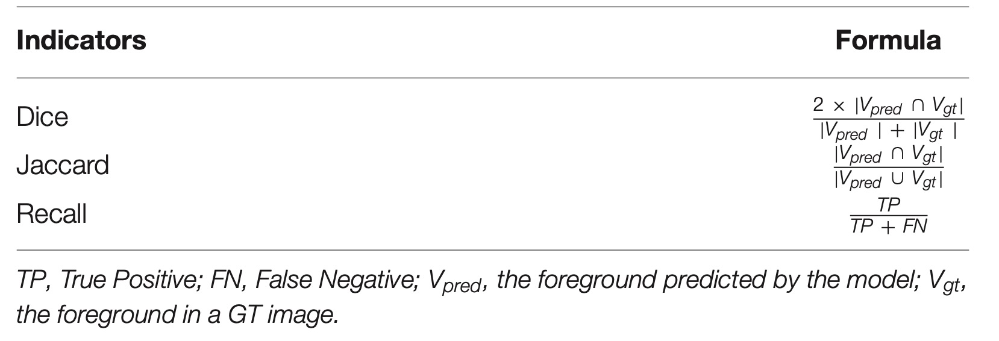

Base Model

In [ ]:
params = {
    "model": "UNet11",
    "device": "cuda",
    "lr": 0.001,
    "batch_size": 16,
    "num_workers": 4,
    "epochs": 10,
}

without data argumentation, just resize the image

In [ ]:
train_transform = A.Compose(
    [
        A.Resize(256, 256),
        A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
        ToTensorV2(),
    ]
)
train_dataset = EMDS6Dataset(train_images_filenames, transform=train_transform)

val_transform = A.Compose(
    [
        A.Resize(256, 256),
        A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
        ToTensorV2(),
    ]
)
val_dataset = EMDS6Dataset(val_images_filenames, transform=val_transform)

In [ ]:
model = create_model(params)
model = train_and_validate(model, train_dataset, val_dataset, params)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG11_Weights.IMAGENET1K_V1`. You can also use `weights=VGG11_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg11-8a719046.pth" to /root/.cache/torch/hub/checkpoints/vgg11-8a719046.pth
100%|██████████| 507M/507M [00:07<00:00, 72.4MB/s]
/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, 

In [ ]:
test_transform = A.Compose(
    [
        A.Resize(256, 256),
        A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
        ToTensorV2(),
    ]
)
test_dataset = EMDS6InferenceDataset(test_images_filenames, transform=test_transform,)

In [ ]:
predictions, _ = predict(model, params, test_dataset, batch_size=1)

Jaccard Index: 0.715887188911438
Dice Score: 0.9362053275108337
Recall: 0.867216944694519


The base model performance. We got:

**Jaccard Index: 71%**

**Dice Score: 93%**

**Recall: 86%**

In the next section, we will provide an effective set of data augmentation methods to enhance the model's performance, which will be further discussed in the Discussion section.

##### Data Argumentation

In our experiments, one key finding is that not every data argumentation could improve the performance of our model.

The following data argumentation methods provided an example of inappropriate data argumentation method could cause negative impact on the performance.

In [ ]:
train_transform = A.Compose(
    [
        A.Resize(256, 256),
        A.ShiftScaleRotate(shift_limit=0.2, scale_limit=0.2, rotate_limit=30, p=0.5),
        A.RGBShift(r_shift_limit=25, g_shift_limit=25, b_shift_limit=25, p=0.5),
        A.RandomBrightnessContrast(brightness_limit=0.3, contrast_limit=0.3, p=0.5),
        A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
        ToTensorV2(),
    ]
)
train_dataset = EMDS6Dataset(train_images_filenames, transform=train_transform,)

val_transform = A.Compose(
    [A.Resize(256, 256), A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)), ToTensorV2()]
)
val_dataset = EMDS6Dataset(val_images_filenames, transform=val_transform,)

The data augmentation methods employed in this code are designed to enhance the robustness and performance of the model but failed.

These methods include:

**ShiftScaleRotate**: Applies random shifts, scales, and rotations to the images.

**RGBShift**: Randomly shifts the RGB color channels.

**RandomBrightnessContrast**: Adjusts the brightness and contrast randomly.

**Normalize**: Normalizes the images using specified mean and standard deviation values.

which are commonly used in many cases.

In [ ]:
model = create_model(params)
model = train_and_validate(model, train_dataset, val_dataset, params)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG11_Weights.IMAGENET1K_V1`. You can also use `weights=VGG11_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg11-8a719046.pth" to /root/.cache/torch/hub/checkpoints/vgg11-8a719046.pth
100%|██████████| 507M/507M [00:03<00:00, 168MB/s]
/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, w

The data augmentation methods employed in this field, including ShiftScaleRotate, RGBShift, RandomBrightnessContrast, and Normalize, have unexpectedly had an adverse effect on the model's performance. Detailed analysis and discussion of these negative impacts will be provided in the Discussion section.

In [ ]:
test_transform = A.Compose(
    [A.Resize(256, 256), A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)), ToTensorV2()],
    is_check_shapes=False
)
test_dataset = EMDS6InferenceDataset(test_images_filenames, transform=test_transform,)
predictions = predict(_model, params, test_dataset, batch_size=1)

Jaccard Index: 0.7033839821815491
Dice Score: 0.935604453086853
Recall: 0.8238416314125061


##### appropriate data argumentation

To identify the optimal augmentation settings, we incrementally increased the complexity and intensity of the augmentations and observed the corresponding changes in model performance. By carefully tuning the augmentation parameters, such as rotation angle and scaling ratio, we aimed to enhance the model's robustness without over-augmenting the data. This iterative approach allowed us to find a balance where the augmentations effectively improved the model's performance while maintaining stability and avoiding excessive augmentation.

In [ ]:
train_transform = A.Compose(
    [
        A.Resize(256, 256),
        A.PadIfNeeded(min_height=256, min_width=256),
        A.RandomCrop(256, 256),
        A.ShiftScaleRotate(shift_limit=0.05, scale_limit=0.05, rotate_limit=15, p=0.5),
        A.RGBShift(r_shift_limit=15, g_shift_limit=15, b_shift_limit=15, p=0.5),
        A.RandomBrightnessContrast(p=0.5),
        A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
        ToTensorV2(),
    ]
)
train_dataset = EMDS6Dataset(train_images_filenames, transform=train_transform)

In [ ]:
val_transform = A.Compose(
    [
        A.Resize(256, 256),
        A.CenterCrop(256, 256),
        A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
        ToTensorV2(),
    ]
)
val_dataset = EMDS6Dataset(val_images_filenames, transform=val_transform,)

In [ ]:
params = {
    "model": "UNet11",
    "device": "cuda",
    "lr": 0.001,
    "batch_size": 16,
    "num_workers": 4,
    "epochs": 10,
}

In [ ]:
model = create_model(params)
model = train_and_validate(model, train_dataset, val_dataset, params)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG11_Weights.IMAGENET1K_V1`. You can also use `weights=VGG11_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg11-8a719046.pth" to /root/.cache/torch/hub/checkpoints/vgg11-8a719046.pth
100%|██████████| 507M/507M [00:07<00:00, 69.5MB/s]
Epoch: 10. Validation. Loss: 0.109: 100%|██████████| 14/14 [00:04<00:00,  3.41it/s]


In [ ]:
test_transform = A.Compose(
    [
        A.Resize(256, 256),
        A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
        ToTensorV2(),
    ]
)
test_dataset = EMDS6InferenceDataset(test_images_filenames, transform=test_transform,)

In [ ]:
predictions, _ = predict(model, params, test_dataset, batch_size=1)

Jaccard Index: 0.7581033110618591
Dice Score: 0.9523049592971802
Recall: 0.8064203262329102


After applying these data argumentation methods we achieved a better performance.

In [ ]:
predicted_masks = []
for predicted_256x256_mask, original_height, original_width in predictions:
    # Define the transformation
    resize_transform = Compose([Resize(height=original_height, width=original_width, interpolation=1)])  # 1 is cv2.INTER_NEAREST in Albumentations
    # Apply the transformation
    full_sized_mask = resize_transform(image=predicted_256x256_mask)['image']
    predicted_masks.append(full_sized_mask)

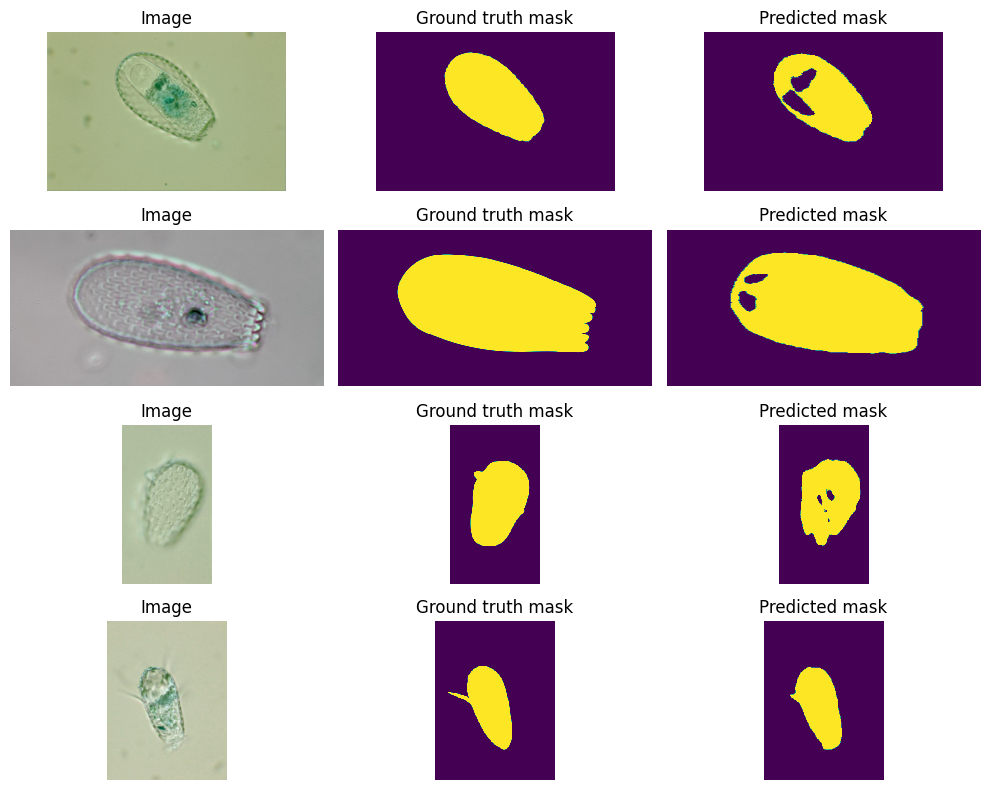

In [ ]:
display_image_grid(test_images_filenames[91:95], predicted_masks=predicted_masks[91:95], figsize=(10, 8))

## Results 

### Image Classification results

In [ ]:
evaluation_results

,Model,Accuracy,Precision,Recall,F1 Score,Used Augmentation
0,fusion_NetV2_xcep_original.h5,0.879365,0.886642,0.879365,0.880002,False
1,inception_epochs30_lr0.001_False.h5,0.800000,0.812759,0.800000,0.800841,False
2,mobilenet_epochs30_lr0.001_False.h5,0.866667,0.876677,0.866667,0.866453,False
3,resnet50_epochs30_lr0.001_False.h5,0.146032,0.165606,0.146032,0.122445,False
4,xception_epochs30_lr0.001_False.h5,0.825397,0.835646,0.825397,0.825107,False


After apply the data argumentation and feature fusion, we fuse the feature extracted from these two models and then add custom layers, which almost give about 90% accuracy, the best performance classification model we have.

### Image Segmentation results

In [ ]:
predictions, _ = predict(model, params, test_dataset, batch_size=1)

Jaccard Index: 0.7581033110618591
Dice Score: 0.9523049592971802
Recall: 0.8064203262329102


After applying these data argumentation methods we achieved a better performance.

In [ ]:
predicted_masks = []
for predicted_256x256_mask, original_height, original_width in predictions:
    # Define the transformation
    resize_transform = Compose([Resize(height=original_height, width=original_width, interpolation=1)])  # 1 is cv2.INTER_NEAREST in Albumentations
    # Apply the transformation
    full_sized_mask = resize_transform(image=predicted_256x256_mask)['image']
    predicted_masks.append(full_sized_mask)

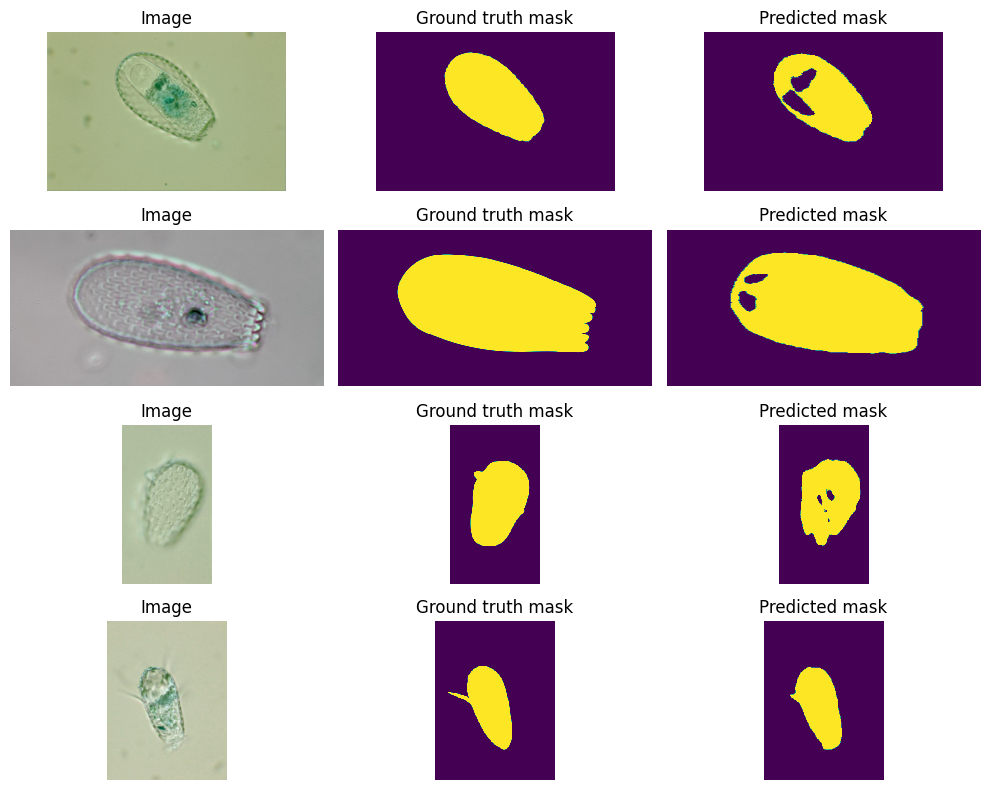

In [ ]:
display_image_grid(test_images_filenames[91:95], predicted_masks=predicted_masks[91:95], figsize=(10, 8))

## Discussion

### Image Classification

Since we found that different model has their advantage on different class’ classifications, therefore the fusion model is created to take advantage of two base pre-train models. The fusion model combined with MobileNetV2 and Xception performs well. We fuse the feature extracted from these two models and then add custom layers, which almost give about 90% accuracy, the best performance classification model we have. 

We tried different classification models, for our dataset, the insight is that the pre-train model with too deep a network does not perform well compared to the lightweight model. For example, when using MobileNetV2 as a pre-trained model feature extractor, the performance is 80% accuracy, with about 2,000,000 params. However, the more complex (deep) network ResNet50, has ten times the params compared to MobileNetV2, which has about 20,000,000 params, but ResNet50 cannot even converge in the training, which has terrible results on our dataset. 


Fusion model training result, fusion model gives a better result beyond each model it integrated from. 

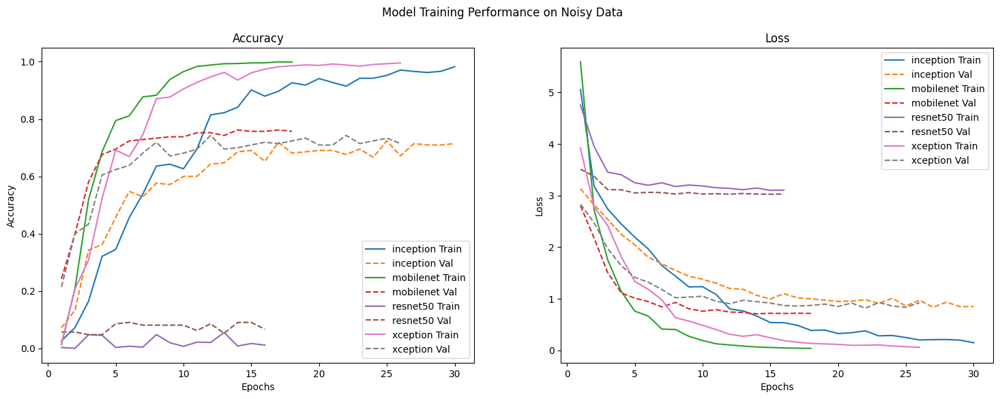

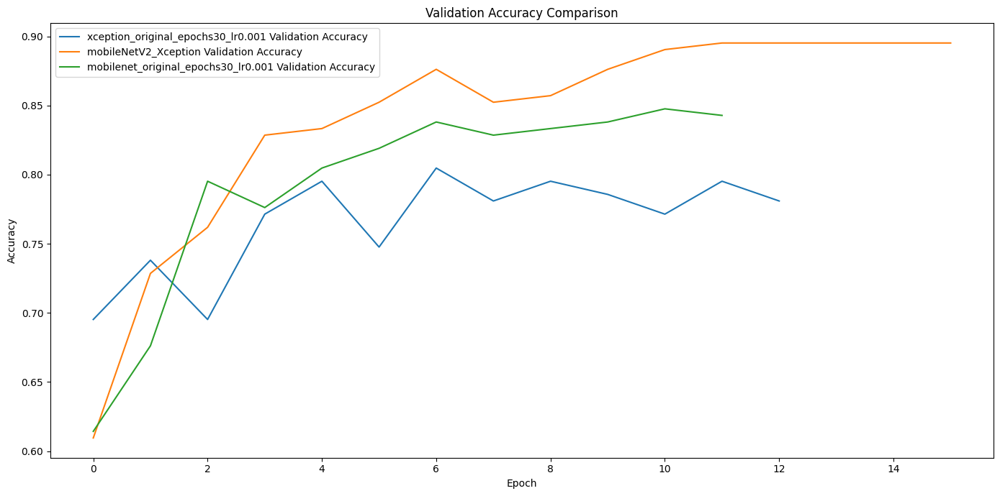

This graph shows that the our feature fusion model coudl greatly improved the performance among all of these three models.

### Image Segmentation

Based on our research on the EMDS-6 dataset, we find that some inappropriate data argumentation methods will decrease the model's performance when used a complex pre-trained model on a extremely small dataset.

1. inappropriate data argumentation parameter:
  If the parameter is too small, it will not have enough influence on Dataset exploration and cannot help the model learn new features.
  On the other hand, if the data argumentation parameter is too large, our model don't get enough data to learn the patterns then it will try to learn the dataset itself especially for those pre-trained models. When model try to memory the training data, we can see a performance increase in the training set and poorly on validation set as well as the test set.  
2. inappropriate data argumentation methods:
  Experiments once again prove that those data augmentation methods (such as Flipping, Color Jittering, and Gamma Transformation) that cause significant changes to images will also face the same challenges.
  To further prove the above experimental results, our report provides the following experiment to explore how HorizontalFlip data argumentation method will influence the performance of our model.

In [ ]:
params = {
    "model": "UNet11",
    "device": "cuda",
    "lr": 0.001,
    "batch_size": 16,
    "num_workers": 4,
    "epochs": 10,
}

performance_metrics = {
    'Jaccard Index': [],
    'Dice Score': [],
    'Recall': []
}

# flip probability from 0 to 0.5, step size 0.1
flip_probs = [0.0, 0.1, 0.2, 0.3, 0.4, 0.5]
for flip_prob in flip_probs:
    # same data argumentation setup with our solution, except HorizontalFlip.
    train_transform = A.Compose(
        [
            A.Resize(256, 256),
            A.PadIfNeeded(min_height=256, min_width=256),
            A.HorizontalFlip(p=flip_prob),
            A.RandomCrop(256, 256),
            A.ShiftScaleRotate(shift_limit=0.05, scale_limit=0.05, rotate_limit=15, p=0.5),
            A.RGBShift(r_shift_limit=15, g_shift_limit=15, b_shift_limit=15, p=0.5),
            A.RandomBrightnessContrast(p=0.5),
            A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
            ToTensorV2(),
        ]
    )
    train_dataset = EMDS6Dataset(train_images_filenames, transform=train_transform)

    val_transform = A.Compose(
        [
            A.Resize(256, 256),
            A.CenterCrop(256, 256),
            A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
            ToTensorV2(),
        ]
    )
    val_dataset = EMDS6Dataset(val_images_filenames, transform=val_transform,)

    model = create_model(params)
    model = train_and_validate(model, train_dataset, val_dataset, params)

    test_transform = A.Compose(
        [
            A.Resize(256, 256),
            A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
            ToTensorV2(),
        ]
    )
    test_dataset = EMDS6InferenceDataset(test_images_filenames, transform=test_transform,)

    predictions, performance_metrix = predict(model, params, test_dataset, batch_size=1)
    # Store the performance metric for the current flip probability
    performance_metrics['Jaccard Index'].append(performance_metrix[0].cpu().numpy())
    performance_metrics['Dice Score'].append(performance_metrix[1].cpu().numpy())
    performance_metrics['Recall'].append(performance_metrix[2].cpu().numpy())

100%|██████████| 14/14 [00:05<00:00,  2.75it/s]


Jaccard Index: 0.7417147159576416
Dice Score: 0.9457710981369019
Recall: 0.8401522636413574


100%|██████████| 14/14 [00:07<00:00,  1.98it/s]


Jaccard Index: 0.700329065322876
Dice Score: 0.9347726702690125
Recall: 0.822388231754303


100%|██████████| 14/14 [00:06<00:00,  2.18it/s]


Jaccard Index: 0.7156884074211121
Dice Score: 0.9345723986625671
Recall: 0.8885465860366821


100%|██████████| 14/14 [00:04<00:00,  3.18it/s]


Jaccard Index: 0.7008386850357056
Dice Score: 0.9288274049758911
Recall: 0.8995291590690613


100%|██████████| 14/14 [00:07<00:00,  1.79it/s]


Jaccard Index: 0.7473410367965698
Dice Score: 0.9514682292938232
Recall: 0.7744615077972412


100%|██████████| 14/14 [00:07<00:00,  1.98it/s]


Jaccard Index: 0.5990414619445801
Dice Score: 0.8849673867225647
Recall: 0.9271891117095947


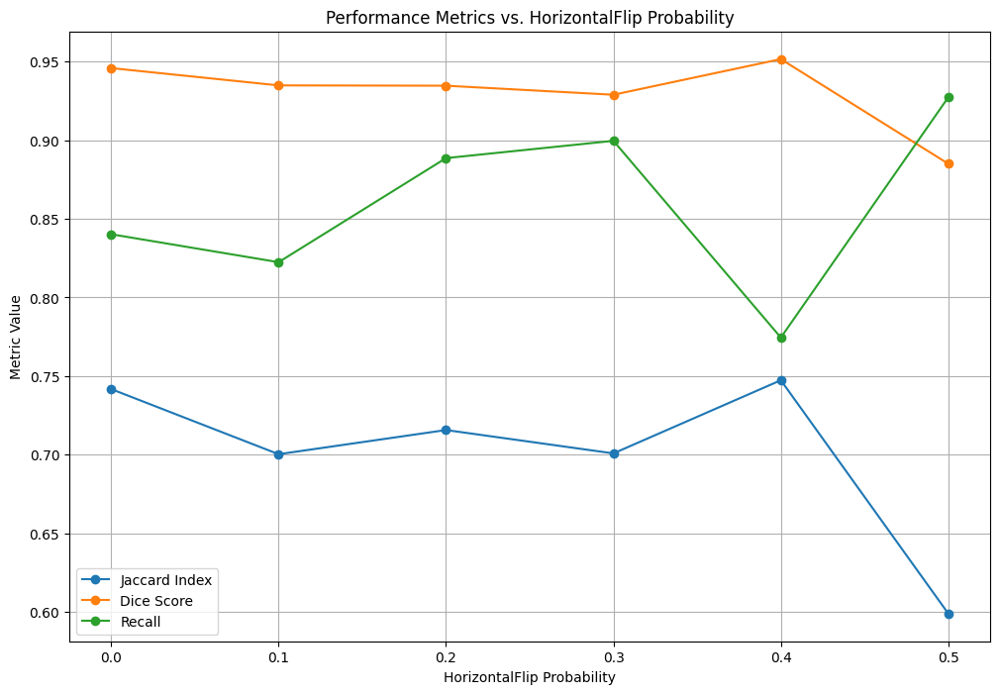

In [ ]:
# Plotting the performance metrics
plt.figure(figsize=(12, 8))

# Jaccard Index
plt.plot(flip_probs, performance_metrics['Jaccard Index'], marker='o', linestyle='-', label='Jaccard Index')

# Dice Score
plt.plot(flip_probs, performance_metrics['Dice Score'], marker='o', linestyle='-', label='Dice Score')

# Recall
plt.plot(flip_probs, performance_metrics['Recall'], marker='o', linestyle='-', label='Recall')

plt.xlabel('HorizontalFlip Probability')
plt.ylabel('Metric Value')
plt.title('Performance Metrics vs. HorizontalFlip Probability')
plt.legend()
plt.grid(True)
plt.show()

Introducing HorizontalFlip will negatively impact the model's performance. As the probability of HorizontalFlip increases, the key metric, the Jaccard Index, shows a decreasing trend. It is evident that with the increasing probability, the overall model parameters experience significant fluctuations. Ultimately, at a probability of 0.5, the Jaccard Index drops to 59%. Excessive data augmentation techniques can pose a challenge to the stability of the entire system.

One other solution could be **Transfer Learning**.

We could find pre-tained models which have similar images classes with our environmental microorganism dataset and then we could download its pre-tained weights from  that, slap in our own fully connected layers and re-train the fully connected layers weights while freezing the convolutional layer weights.

But, due to time constraints, we were unable to further explore this solution after completing the project. We have two primary concerns regarding this approach:
1. **Insufficient Data for Training:** Extremely small datasets like EMDS-6, which have only 15 images per class in the training set, may not provide enough data to effectively train our custom fully connected layers. This could hinder the model's ability to generalize well.
2. **Lack of Domain Expertise:** Our current team lacks members with a biology background. Consequently, we might not have the necessary expertise to accurately discern which pre-trained models or specific classes could be effectively leveraged for Transfer Learning in this domain.

These concerns highlight potential limitations and challenges in our approach, which warrant further investigation and possibly collaboration with domain experts.